In [ ]:
from google.colab import drive
drive.mount('/gdrive',force_remount=True)
%cd /gdrive/My Drive/TESI MATTEO IV

Mounted at /gdrive
/gdrive/My Drive/TESI MATTEO IV


In [ ]:
# Fix randomness and hide warnings
seed = 42

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
os.environ['PYTHONHASHSEED'] = str(seed)
os.environ['MPLCONFIGDIR'] = os.getcwd()+'/configs/'

import warnings

warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=Warning)

import numpy as np
np.random.seed(seed)

import logging

import random
random.seed(seed)

In [ ]:
# Import tensorflow
import tensorflow as tf
from tensorflow import keras as tfk
from tensorflow.keras import layers as tfkl
from tensorflow.keras import models
tf.autograph.set_verbosity(0)
tf.get_logger().setLevel(logging.ERROR)
tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)
tf.random.set_seed(seed)
tf.compat.v1.set_random_seed(seed)
print(tf.__version__)

2.15.0


In [ ]:
import pandas as pd
import seaborn as sns
from datetime import datetime
import matplotlib.pyplot as plt
plt.rc('font', size=16)
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
import pickle

In [ ]:
import os
os.listdir()

['D_ICD_DIAGNOSES.gsheet',
 'mimicIV_24h_diagnoses.csv',
 'mimicIV_24h_procedures.csv',
 'Embeddings Diagnoses Procedures',
 '24h_Procedures_embeddings.pkl',
 '90pca_transformed_embeddings_procedures.pkl',
 'mimicIV_24h_comorbidities.csv',
 '24h_Diagnoses_embeddings.pkl',
 '90pca_transformed_embeddings_diagnoses.pkl',
 'Prediction',
 'mimicIV_24h_complete_blood.csv',
 'mimicIV_24h_complete_lab.csv',
 'mimicIV_24h_complete_art.csv',
 'mimicIV_24h_prescriptions.csv',
 '24h_1MedicalPrescription_embeddings.pkl',
 '24h_4MedicalPrescription_embeddings.pkl',
 '24h_3MedicalPrescription_embeddings.pkl',
 '90pca_transformed_embeddings_prescription.pkl',
 '24h_2MedicalPrescription_embeddings.pkl',
 'mimicIV_24h_complete_demo.csv',
 'mimicIV_24h_additional.csv',
 'd_icd_diagnoses (1).gsheet',
 '1mimicIV_24h_complete_demo.csv',
 '1mimicIV_24h_additional.csv',
 '1mimicIV_24h_complete_art.csv',
 '1mimicIV_24h_complete_blood.csv',
 '1mimicIV_24h_complete_lab.csv',
 'combined_embeddings_matrix_standard

## UPLOAD DATASETS

#### FIRST DAY DATASETS

In [ ]:
df_demo = pd.read_csv('1mimicIV_24h_complete_demo.csv')
print("Initial DataFrame shape:", df_demo.shape)
df_demo.head()

Initial DataFrame shape: (41476, 50)


,subject_id,hadm_id,stay_id,admittime,dischtime,icu_admission_time,age_at_icu_intime,gender,dod,race,...,vitals_spo2_mean,vitals_glucose_min,vitals_glucose_max,vitals_glucose_mean,height,weight,urine_output,rrt_dialysis_present,rrt_dialysis_active,rrt_dialysis_type
0,10000032,29079034,39553978,2180-07-23 12:35:00,2180-07-25 17:55:00,2180-07-23 14:00:00,52,F,2180-09-09,WHITE,...,96.300000,115.0,115.0,115.000000,152.0,39.4,175.0,NaN,NaN,NaN
1,10000980,26913865,39765666,2189-06-27 07:38:00,2189-07-03 03:00:00,2189-06-27 08:42:00,76,F,2193-08-26,BLACK/AFRICAN AMERICAN,...,98.909091,109.0,110.0,109.500000,NaN,76.2,3900.0,NaN,NaN,NaN
2,10001725,25563031,31205490,2110-04-11 15:08:00,2110-04-14 15:00:00,2110-04-11 15:52:22,46,F,NaN,WHITE,...,98.125000,146.0,161.0,153.000000,157.0,72.2,1965.0,NaN,NaN,NaN
3,10002013,23581541,39060235,2160-05-18 07:45:00,2160-05-23 13:30:00,2160-05-18 10:00:53,57,F,NaN,OTHER,...,97.050000,98.0,216.0,138.052632,157.0,96.0,1640.0,NaN,NaN,NaN
4,10002155,23822395,33685454,2129-08-04 12:44:00,2129-08-18 16:53:00,2129-08-04 12:45:00,81,F,2131-03-10,WHITE,...,92.640000,95.0,107.0,101.000000,NaN,53.0,2000.0,NaN,NaN,NaN


In [ ]:
time_df = df_demo[['stay_id', 'admittime', 'dischtime']]
print(time_df.shape)

(41476, 3)


In [ ]:
df_demo.drop(columns=['subject_id', 'hadm_id','admittime', 'dischtime','icu_admission_time'], inplace=True)
df_demo['gender'] = df_demo['gender'].replace({'F': 0, 'M': 1})

In [ ]:
df_lab = pd.read_csv('mimicIV_24h_complete_lab.csv')
print("Initial DataFrame shape:", df_lab.shape)
df_lab.head()

Initial DataFrame shape: (40170, 60)


,subject_id,hadm_id,stay_id,icu_admission_time,lab_potassium_min,lab_potassium_max,lab_abs_basophils_min,lab_abs_basophils_max,lab_abs_eosinophils_min,lab_abs_eosinophils_max,...,lab_bilirubin_indirect_min,lab_bilirubin_indirect_max,lab_ck_cpk_min,lab_ck_cpk_max,lab_ck_mb_min,lab_ck_mb_max,lab_ggt_min,lab_ggt_max,lab_ld_ldh_min,lab_ld_ldh_max
0,10000032,29079034,39553978,2180-07-23 14:00:00,4.7,5.0,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,173.0,173.0
1,10000980,26913865,39765666,2189-06-27 08:42:00,3.9,4.2,0.0212,0.0212,0.1431,0.1431,...,NaN,NaN,263.0,303.0,6.0,9.0,NaN,NaN,NaN,NaN
2,10001217,27703517,34592300,2157-12-19 15:42:24,4.3,4.3,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10001725,25563031,31205490,2110-04-11 15:52:22,3.5,3.9,0.0510,0.0510,0.0170,0.0170,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10002013,23581541,39060235,2160-05-18 10:00:53,4.0,4.7,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [ ]:
df_lab.drop(columns=['subject_id','hadm_id','icu_admission_time'], inplace=True)

In [ ]:
df_blood = pd.read_csv('mimicIV_24h_complete_blood.csv')
print("Initial DataFrame shape:", df_blood.shape)
df_blood.head()

Initial DataFrame shape: (40170, 46)


,subject_id,hadm_id,stay_id,icu_admission_time,bg_lactate_min,bg_lactate_max,bg_ph_min,bg_ph_max,bg_so2_min,bg_so2_max,...,bg_chloride_min,bg_chloride_max,bg_calcium_min,bg_calcium_max,bg_glucose_min,bg_glucose_max,bg_potassium_min,bg_potassium_max,bg_sodium_min,bg_sodium_max
0,10000032,29079034,39553978,2180-07-23 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10000980,26913865,39765666,2189-06-27 08:42:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10001217,27703517,34592300,2157-12-19 15:42:24,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10001725,25563031,31205490,2110-04-11 15:52:22,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10002013,23581541,39060235,2160-05-18 10:00:53,2.3,3.3,7.27,7.4,96.0,99.0,...,101.0,109.0,1.07,1.18,135.0,332.0,3.2,4.5,136.0,138.0


In [ ]:
df_blood.drop(columns=['subject_id', 'icu_admission_time', 'hadm_id'], inplace=True)

In [ ]:
df_art = pd.read_csv('mimicIV_24h_complete_art.csv')

print("Initial DataFrame shape:", df_art.shape)
df_art.head()

Initial DataFrame shape: (40170, 46)


,subject_id,hadm_id,stay_id,icu_admission_time,bg_art_lactate_min,bg_art_lactate_max,bg_art_ph_min,bg_art_ph_max,bg_art_so2_min,bg_art_so2_max,...,bg_art_chloride_min,bg_art_chloride_max,bg_art_calcium_min,bg_art_calcium_max,bg_art_glucose_min,bg_art_glucose_max,bg_art_potassium_min,bg_art_potassium_max,bg_art_sodium_min,bg_art_sodium_max
0,10000032,29079034,39553978,2180-07-23 14:00:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,10000980,26913865,39765666,2189-06-27 08:42:00,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,10001217,27703517,34592300,2157-12-19 15:42:24,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,10001725,25563031,31205490,2110-04-11 15:52:22,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,10002013,23581541,39060235,2160-05-18 10:00:53,2.3,3.3,7.27,7.4,96.0,99.0,...,101.0,109.0,1.07,1.18,135.0,332.0,3.2,4.5,136.0,138.0


In [ ]:
df_art.drop(columns=['subject_id', 'icu_admission_time', 'hadm_id'], inplace=True)

In [ ]:
df_oas = pd.read_csv('1mimicIV_24h_additional.csv')
print("Initial DataFrame shape:", df_oas.shape)

Initial DataFrame shape: (296315, 12)


In [ ]:
df_oas = df_oas.drop_duplicates(subset='stay_id')
print("DataFrame shape after removing duplicates:", df_oas.shape)
df_oas.head()

DataFrame shape after removing duplicates: (40170, 12)


,subject_id,hadm_id,stay_id,icu_admission_time,ventilation_status,suspected_infection,oasis,sapsii,sepsis3,sirs,LODS,meld
0,10000032,29079034,39553978,2180-07-23 14:00:00,SupplementalOxygen,NaN,31,38,NaN,2,7,22.313
1,10000980,26913865,39765666,2189-06-27 08:42:00,NaN,1.0,18,30,NaN,1,3,17.000
3,10001217,27703517,34592300,2157-12-19 15:42:24,NaN,NaN,17,22,NaN,2,1,7.000
4,10001725,25563031,31205490,2110-04-11 15:52:22,SupplementalOxygen,NaN,18,23,NaN,3,2,6.000
5,10002013,23581541,39060235,2160-05-18 10:00:53,InvasiveVent,1.0,32,32,True,3,3,9.000


In [ ]:
df_oas.drop(columns=['subject_id', 'icu_admission_time', 'hadm_id'], inplace=True)

In [ ]:
df_com = pd.read_csv('mimicIV_24h_comorbidities.csv')
print("Initial DataFrame shape:", df_com.shape)
df_com.head()

Initial DataFrame shape: (50559, 20)


,subject_id,hadm_id,stay_id,myocardial_infarct,congestive_heart_failure,peripheral_vascular_disease,cerebrovascular_disease,dementia,chronic_pulmonary_disease,rheumatic_disease,peptic_ulcer_disease,mild_liver_disease,diabetes_without_cc,diabetes_with_cc,paraplegia,renal_disease,malignant_cancer,severe_liver_disease,metastatic_solid_tumor,aids
0,10000032,29079034,39553978,0,0,0,0,0,1,0,0,1,0,0,0,0,0,0,0,0
1,10000980,26913865,39765666,1,1,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0
2,10001217,27703517,34592300,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,10001725,25563031,31205490,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0
4,10002013,23581541,39060235,1,1,1,0,0,1,0,0,0,0,1,0,0,0,0,0,0


#### MERGING OF FIRST DAY DATASETS

In [ ]:
complete_df = pd.merge(df_demo, df_lab, on='stay_id', how='inner')
complete_df = pd.merge(complete_df, df_blood, on='stay_id', how='inner')
complete_df = pd.merge(complete_df, df_art, on='stay_id', how='inner')
complete_df = pd.merge(complete_df, df_oas, on='stay_id', how='inner')
complete_df = pd.merge(complete_df, df_com, on='stay_id', how='inner')

complete_df = complete_df.drop_duplicates()

print(complete_df.shape)
complete_df.head()

(38373, 212)


,stay_id,age_at_icu_intime,gender,dod,race,admission_location,admission_type,insurance,language,marital_status,...,peptic_ulcer_disease,mild_liver_disease,diabetes_without_cc,diabetes_with_cc,paraplegia,renal_disease,malignant_cancer,severe_liver_disease,metastatic_solid_tumor,aids
0,39553978,52,0,2180-09-09,WHITE,EMERGENCY ROOM,EW EMER.,Medicaid,ENGLISH,WIDOWED,...,0,1,0,0,0,0,0,0,0,0
1,39765666,76,0,2193-08-26,BLACK/AFRICAN AMERICAN,EMERGENCY ROOM,EW EMER.,Medicare,ENGLISH,MARRIED,...,0,0,1,0,0,1,0,0,0,0
2,31205490,46,0,NaN,WHITE,PACU,EW EMER.,Other,ENGLISH,MARRIED,...,0,0,0,0,0,0,0,0,0,0
3,39060235,57,0,NaN,OTHER,PHYSICIAN REFERRAL,SURGICAL SAME DAY ADMISSION,Medicare,ENGLISH,SINGLE,...,0,0,0,1,0,0,0,0,0,0
4,33685454,81,0,2131-03-10,WHITE,PROCEDURE SITE,EW EMER.,Other,ENGLISH,MARRIED,...,0,0,0,0,0,1,1,0,0,0


#### MERGING THE DATASETS ON THE ICUSTAY_ID

In [ ]:
diagnoses_embeddings_file = '/gdrive/My Drive/TESI MATTEO IV/90pca_transformed_embeddings_diagnoses.pkl'
procedures_embeddings_file = '/gdrive/My Drive/TESI MATTEO IV/90pca_transformed_embeddings_procedures.pkl'
prescriptions_embeddings_file ='/gdrive/My Drive/TESI MATTEO IV/90pca_transformed_embeddings_prescription.pkl'

In [ ]:
with open(diagnoses_embeddings_file, 'rb') as file:
    pca_transformed_diagnoses = pickle.load(file)

with open(procedures_embeddings_file, 'rb') as file:
    pca_transformed_procedures = pickle.load(file)

with open(prescriptions_embeddings_file, 'rb') as file:
    pca_transformed_prescriptions = pickle.load(file)

In [ ]:
print("Shape of PCA-transformed Diagnoses Embeddings:", pca_transformed_diagnoses.shape)
print("Shape of PCA-transformed Procedures Embeddings:", pca_transformed_procedures.shape)
print("Shape of PCA-transformed Prescriptions Embeddings:", pca_transformed_prescriptions.shape)

Shape of PCA-transformed Diagnoses Embeddings: (50540, 112)
Shape of PCA-transformed Procedures Embeddings: (40053, 76)
Shape of PCA-transformed Prescriptions Embeddings: (40066, 75)


In [ ]:
print("Unique IDs in PCA-transformed Diagnoses Embeddings:", pca_transformed_diagnoses['stay_id'].nunique())
print("Unique IDs in PCA-transformed Procedures Embeddings:", pca_transformed_procedures['stay_id'].nunique())
print("Unique IDs in PCA-transformed Prescriptions Embeddings:", pca_transformed_prescriptions['stay_id'].nunique())
print("Unique IDs in df_fa:", complete_df['stay_id'].nunique())

Unique IDs in PCA-transformed Diagnoses Embeddings: 50540
Unique IDs in PCA-transformed Procedures Embeddings: 40053
Unique IDs in PCA-transformed Prescriptions Embeddings: 40066
Unique IDs in df_fa: 38373


In [ ]:
# Convert ICUSTAY_IDs to sets for easy comparison
diagnoses_ids = set(pca_transformed_diagnoses['stay_id'].unique())
procedures_ids = set(pca_transformed_procedures['stay_id'].unique())
prescriptions_ids = set(pca_transformed_prescriptions['stay_id'].unique())
complete_ids = set(complete_df['stay_id'].unique())

common_ids = diagnoses_ids & procedures_ids & prescriptions_ids & complete_ids

print("Number of common IDs:", len(common_ids))

Number of common IDs: 30651


In [ ]:
pca_transformed_diagnoses = pca_transformed_diagnoses[pca_transformed_diagnoses['stay_id'].isin(common_ids)]
pca_transformed_procedures = pca_transformed_procedures[pca_transformed_procedures['stay_id'].isin(common_ids)]
pca_transformed_prescriptions = pca_transformed_prescriptions[pca_transformed_prescriptions['stay_id'].isin(common_ids)]
complete_df = complete_df[complete_df['stay_id'].isin(common_ids)]

print("PCA-transformed Diagnoses Embeddings shape:", pca_transformed_diagnoses.shape)
print("PCA-transformed Procedures Embeddings shape:", pca_transformed_procedures.shape)
print("PCA-transformed Prescriptions Embeddings shape:", pca_transformed_prescriptions.shape)
print("complete_df shape:", complete_df.shape)

PCA-transformed Diagnoses Embeddings shape: (30651, 112)
PCA-transformed Procedures Embeddings shape: (30651, 76)
PCA-transformed Prescriptions Embeddings shape: (30651, 75)
complete_df shape: (30651, 212)


#### FLAG MISSING VALUES IN DOD

In [ ]:
# Fill NaN values in 'DOD' with -1 to indicate the subject is alive
complete_df['dod'] = complete_df['dod'].fillna(-1)

In [ ]:
dod_counts = complete_df['dod'].value_counts()
print(dod_counts)

# Specifically printing the count of '-1' values
alive_count = dod_counts.get(-1, 0)
print("Number of subjects alive (DOD is -1):", alive_count)

dod
-1            20985
2177-09-16        5
2175-05-04        4
2170-09-20        4
2146-12-19        4
              ...  
2165-01-24        1
2134-01-09        1
2123-10-03        1
2148-01-19        1
2185-12-05        1
Name: count, Length: 8333, dtype: int64
Number of subjects alive (DOD is -1): 20985


#### SEPSIS 3

In [ ]:
complete_df['sepsis3'] = complete_df['sepsis3'].map({True: 1, False: 0}).fillna(0).astype(int)

missing_values_count = complete_df['sepsis3'].isna().sum()
print("Missing values in 'sepsis3':", missing_values_count)

Missing values in 'sepsis3': 0


#### SUSPECTED INFECTION

In [ ]:
complete_df['suspected_infection'] = complete_df['suspected_infection'].fillna(0)

#### RTT

In [ ]:
print("Unique values in 'rrt_dialysis_present':", complete_df['rrt_dialysis_present'].unique())
print("Unique values in 'rrt_dialysis_active':", complete_df['rrt_dialysis_active'].unique())
print("Unique values in 'rrt_dialysis_type':", complete_df['rrt_dialysis_type'].unique())

Unique values in 'rrt_dialysis_present': [nan  1.]
Unique values in 'rrt_dialysis_active': [nan  1.  0.]
Unique values in 'rrt_dialysis_type': [nan 'IHD' 'CRRT' 'CRRT, CVVHDF' 'Peritoneal' 'CVVHD, CRRT'
 'CRRT, IHD, CVVHDF' 'IHD, CRRT, CVVHDF' 'CVVHDF, CRRT' 'Peritoneal, IHD'
 'Peritoneal, CRRT, CVVHDF' 'CRRT, CVVHDF, IHD' 'CVVHDF' 'CRRT, CVVHD'
 'CVVHDF, IHD, CRRT' 'IHD, CVVHDF' 'CRRT, Peritoneal']


In [ ]:
complete_df['rrt_dialysis_present'] = complete_df['rrt_dialysis_present'].fillna(0)
complete_df= complete_df.drop(columns =['rrt_dialysis_active'])
complete_df['rrt_dialysis_type'] = complete_df['rrt_dialysis_type'].fillna('None')

#### HEIGHT

In [ ]:
complete_df= complete_df.drop(columns =['height'])

#### EVALUATE MISSING DATA

In [ ]:
# Rows
def drop_rows_with_high_missing_values(df, row_threshold_percent):

    row_missing_percentage = df.isna().sum(axis=1) / df.shape[1] * 100
    rows_to_keep = row_missing_percentage <= row_threshold_percent
    cleaned_df = df[rows_to_keep]

    return cleaned_df

In [ ]:
row_threshold_percent = 60
cleaned_df = drop_rows_with_high_missing_values(complete_df, row_threshold_percent)

print('Original DataFrame shape:', complete_df.shape)
print('Cleaned DataFrame shape:', cleaned_df.shape)

Original DataFrame shape: (30651, 210)
Cleaned DataFrame shape: (27007, 210)


In [ ]:
complete_df_cleaned = cleaned_df

In [ ]:
# complete_df_cleaned = complete_df

## DEFINE THE TARGETS

In [ ]:
from datetime import datetime

In [ ]:
def is_in_hospital_death(dod_date):
    return 0 if dod_date == -1 else 1

In [ ]:
complete_df_cleaned['dod'] = complete_df_cleaned['dod'].apply(lambda x: pd.to_datetime(x, errors='coerce') if x != -1 else -1)

complete_df_cleaned['in_hospital_death'] = complete_df_cleaned['dod'].apply(is_in_hospital_death)

Class counts:
 in_hospital_death
0    18056
1     8951
Name: count, dtype: int64
Class distribution (%):
 in_hospital_death
0    66.856741
1    33.143259
Name: count, dtype: float64


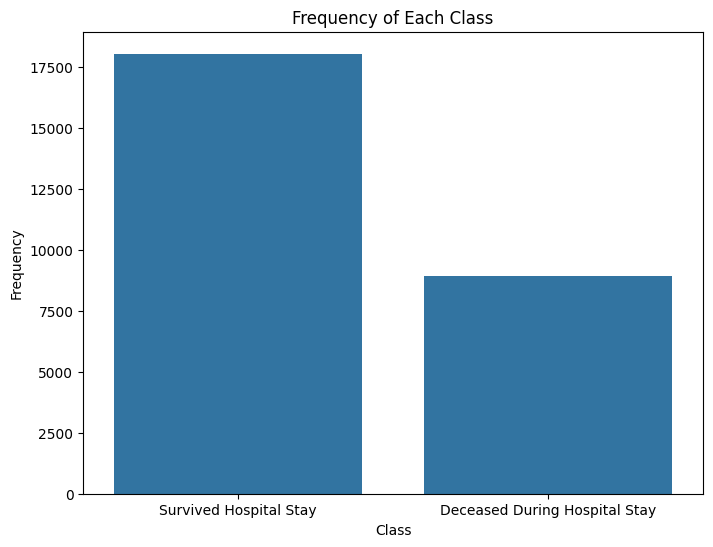

In [ ]:
# Set plot style
plt.style.use('default')
plt.rcParams['axes.facecolor'] = 'white'

class_counts = complete_df_cleaned['in_hospital_death'].value_counts()
print("Class counts:\n", class_counts)

class_percentage = (class_counts / len(complete_df_cleaned)) * 100
print("Class distribution (%):\n", class_percentage)

# Plotting the class frequencies
plt.figure(figsize=(8, 6))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.title('Frequency of Each Class')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks([0, 1], ['Survived Hospital Stay', 'Deceased During Hospital Stay'])
plt.show()

#### REMOVE THE TARGETS FROM THE DATASET

In [ ]:
# Define the target variables and ID columns
targets = ['dod', 'in_hospital_death']
ids = ['stay_id']

# Correctly create DataFrames from existing DataFrame using IDs and target variables
length_of_stay_data = complete_df_cleaned[ids + targets]
mortality_data = complete_df_cleaned[ids + ['dod','in_hospital_death']]

# Now remove the targets from the original DataFrame
df_fa_cleaned = complete_df_cleaned.drop(columns=targets, errors='ignore')

# Verification by outputting the columns of each DataFrame
print("Length of Stay data columns:", length_of_stay_data.columns)
print("Data without targets DataFrame columns:", complete_df_cleaned.columns)

Length of Stay data columns: Index(['stay_id', 'dod', 'in_hospital_death'], dtype='object')
Data without targets DataFrame columns: Index(['stay_id', 'age_at_icu_intime', 'gender', 'dod', 'race',
       'admission_location', 'admission_type', 'insurance', 'language',
       'marital_status',
       ...
       'mild_liver_disease', 'diabetes_without_cc', 'diabetes_with_cc',
       'paraplegia', 'renal_disease', 'malignant_cancer',
       'severe_liver_disease', 'metastatic_solid_tumor', 'aids',
       'in_hospital_death'],
      dtype='object', length=211)


## DIVISON OF NUMERICAL / CATEGORICAL / DUMMY ATTRIBUTES

In [ ]:
complete_df_cleaned = complete_df_cleaned.drop(columns=['subject_id','hadm_id'])

In [ ]:
# Initialize the DataFrames for each type of attributes
numerical_attributes = pd.DataFrame()
categorical_attributes = pd.DataFrame()
dummy_attributes = pd.DataFrame()

In [ ]:
# Detect dummy variables
def is_dummy(series):
    return sorted(series.unique()) == [0, 1]

# Iterate through each column and classify them
for column in complete_df_cleaned.columns:
    if complete_df_cleaned[column].dtype in ['int64', 'float64']:
        if is_dummy(complete_df_cleaned[column]):
            dummy_attributes[column] = complete_df_cleaned[column]
        else:
            numerical_attributes[column] = complete_df_cleaned[column]
    else:
        categorical_attributes[column] = complete_df_cleaned[column]

In [ ]:
for df in [numerical_attributes, categorical_attributes, dummy_attributes]:
    for id_col in ids:
        if id_col in complete_df_cleaned.columns and id_col not in df:
            df[id_col] = complete_df_cleaned[id_col]

# Outputs to check
print("Numerical Attributes: ", numerical_attributes.shape)
print("Numerical Attributes Columns: ", numerical_attributes.columns)
print("Categorical Attributes: ", categorical_attributes.shape)
print("Categorical Attributes Columns: ", categorical_attributes.columns)
print("Dummy Attributes: ", dummy_attributes.shape)
print("Dummy Attributes Columns: ", dummy_attributes.columns)

Numerical Attributes:  (27007, 178)
Numerical Attributes Columns:  Index(['stay_id', 'age_at_icu_intime', 'gcs_min', 'gcs_eyes', 'gcs_verbal',
       'gcs_motor', 'SOFA', 'vitals_heart_rate_min', 'vitals_heart_rate_max',
       'vitals_heart_rate_mean',
       ...
       'bg_art_glucose_max', 'bg_art_potassium_min', 'bg_art_potassium_max',
       'bg_art_sodium_min', 'bg_art_sodium_max', 'oasis', 'sapsii', 'sirs',
       'LODS', 'meld'],
      dtype='object', length=178)
Categorical Attributes:  (27007, 10)
Categorical Attributes Columns:  Index(['dod', 'race', 'admission_location', 'admission_type', 'insurance',
       'language', 'marital_status', 'rrt_dialysis_type', 'ventilation_status',
       'stay_id'],
      dtype='object')
Dummy Attributes:  (27007, 23)
Dummy Attributes Columns:  Index(['gender', 'rrt_dialysis_present', 'suspected_infection', 'sepsis3',
       'myocardial_infarct', 'congestive_heart_failure',
       'peripheral_vascular_disease', 'cerebrovascular_disease', 'de

## CATEGORICAL ATTRIBUTES

#### TYPE OF ADMISSION

In [ ]:
admission_location_counts = categorical_attributes['admission_type'].value_counts()
print(admission_location_counts)

admission_type
EW EMER.                       14099
URGENT                          4778
SURGICAL SAME DAY ADMISSION     3922
OBSERVATION ADMIT               2184
ELECTIVE                        1226
DIRECT EMER.                     752
EU OBSERVATION                    24
DIRECT OBSERVATION                14
AMBULATORY OBSERVATION             8
Name: count, dtype: int64


In [ ]:
def group_admission_types(admission_type):
    if admission_type in ['EW EMER.', 'DIRECT EMER.']:
        return 'Emergency-Related'
    elif admission_type == 'URGENT':
        return 'Urgent'
    elif admission_type in ['OBSERVATION ADMIT', 'EU OBSERVATION', 'DIRECT OBSERVATION', 'AMBULATORY OBSERVATION']:
        return 'Observation'
    elif admission_type == 'ELECTIVE':
        return 'Elective'
    elif admission_type == 'SURGICAL SAME DAY ADMISSION':
        return 'Surgical'

In [ ]:
categorical_attributes['admission_type'] = categorical_attributes['admission_type'].apply(group_admission_types)

print(categorical_attributes['admission_type'].value_counts())

admission_type
Emergency-Related    14851
Urgent                4778
Surgical              3922
Observation           2230
Elective              1226
Name: count, dtype: int64


#### ADMISSION LOCATION

In [ ]:
admission_location_counts = categorical_attributes['admission_location'].value_counts()
print(admission_location_counts)

admission_location
EMERGENCY ROOM                            12705
PHYSICIAN REFERRAL                         7069
TRANSFER FROM HOSPITAL                     5833
WALK-IN/SELF REFERRAL                       425
PROCEDURE SITE                              372
TRANSFER FROM SKILLED NURSING FACILITY      197
PACU                                        153
CLINIC REFERRAL                             127
INFORMATION NOT AVAILABLE                   102
AMBULATORY SURGERY TRANSFER                  22
INTERNAL TRANSFER TO OR FROM PSYCH            2
Name: count, dtype: int64


In [ ]:
def group_admission_locations(location):
    if location == 'EMERGENCY ROOM':
        return 'Emergency'
    elif location in ['PHYSICIAN REFERRAL', 'CLINIC REFERRAL']:
        return 'Referral'
    elif location in ['TRANSFER FROM HOSPITAL', 'TRANSFER FROM SKILLED NURSING FACILITY', 'AMBULATORY SURGERY TRANSFER', 'INTERNAL TRANSFER TO OR FROM PSYCH']:
        return 'Transfer'
    elif location == 'WALK-IN/SELF REFERRAL':
        return 'Direct Admission'
    elif location in ['PROCEDURE SITE', 'PACU']:
        return 'Procedure-Related'
    elif location == 'INFORMATION NOT AVAILABLE':
        return 'Unknown'

In [ ]:
categorical_attributes['admission_location'] = categorical_attributes['admission_location'].apply(group_admission_locations)

print(categorical_attributes['admission_location'].value_counts())

admission_location
Emergency            12705
Referral              7196
Transfer              6054
Procedure-Related      525
Direct Admission       425
Unknown                102
Name: count, dtype: int64


#### MARITAL STATUS

In [ ]:
admission_location_counts = categorical_attributes['marital_status'].value_counts()
print(admission_location_counts)

marital_status
MARRIED     12327
SINGLE       6964
WIDOWED      3027
DIVORCED     1893
Name: count, dtype: int64


In [ ]:
ventilation_status_counts = categorical_attributes['ventilation_status'].value_counts()
print(ventilation_status_counts)

ventilation_status
InvasiveVent          12975
SupplementalOxygen     8404
HFNC                    468
NonInvasiveVent         288
Tracheostomy             56
Name: count, dtype: int64


#### VENTILATION STATUS

In [ ]:
ventilation_status_counts = categorical_attributes['ventilation_status'].value_counts()
print(ventilation_status_counts)

ventilation_status
InvasiveVent          12975
SupplementalOxygen     8404
HFNC                    468
NonInvasiveVent         288
Tracheostomy             56
Name: count, dtype: int64


In [ ]:
def group_ventilation(ventilation_status):
    if ventilation_status is None or pd.isna(ventilation_status):
        return 'None'
    elif 'SupplementalOxygen' in ventilation_status:
        return 'NonInvasiveVent'
    elif 'HFNC' in ventilation_status:
        return 'InvasiveVent'
    else:
        return 'InvasiveVent'

In [ ]:
categorical_attributes['ventilation_status'] = categorical_attributes['ventilation_status'].apply(group_ventilation)

grouped_ventilation_counts = categorical_attributes['ventilation_status'].value_counts()
print(grouped_ventilation_counts)

ventilation_status
InvasiveVent       13787
NonInvasiveVent     8404
None                4816
Name: count, dtype: int64


#### RTT

In [ ]:
rtt_status_counts = categorical_attributes['rrt_dialysis_type'].value_counts()
print(rtt_status_counts)

rrt_dialysis_type
None                        26333
IHD                           357
CRRT, CVVHDF                  179
Peritoneal                     48
CRRT                           39
CVVHDF, CRRT                   19
IHD, CRRT, CVVHDF               9
CVVHDF                          6
CVVHD, CRRT                     4
Peritoneal, IHD                 4
Peritoneal, CRRT, CVVHDF        2
CVVHDF, IHD, CRRT               2
CRRT, IHD, CVVHDF               1
CRRT, CVVHDF, IHD               1
CRRT, CVVHD                     1
IHD, CVVHDF                     1
CRRT, Peritoneal                1
Name: count, dtype: int64


In [ ]:
def group_dialysis_types(dialysis_type):
    if pd.isna(dialysis_type) or dialysis_type == 'None':
        return 'None'
    elif 'Peritoneal' in dialysis_type:
        return 'Peritoneal'
    elif 'IHD' in dialysis_type:
        return 'IHD-Based'
    else:
        return 'CRRT-Based'

In [ ]:
categorical_attributes['rrt_dialysis_type'] = categorical_attributes['rrt_dialysis_type'].apply(group_dialysis_types)

grouped_rrt_counts = categorical_attributes['rrt_dialysis_type'].value_counts()
print(grouped_rrt_counts)

rrt_dialysis_type
None          26333
IHD-Based       371
CRRT-Based      248
Peritoneal       55
Name: count, dtype: int64


#### RACE

In [ ]:
admission_location_counts = categorical_attributes['race'].value_counts()
print(admission_location_counts)

race
WHITE                                        17014
UNKNOWN                                       3429
BLACK/AFRICAN AMERICAN                        1854
OTHER                                          952
WHITE - OTHER EUROPEAN                         483
UNABLE TO OBTAIN                               450
ASIAN                                          347
ASIAN - CHINESE                                297
HISPANIC OR LATINO                             286
HISPANIC/LATINO - PUERTO RICAN                 258
PATIENT DECLINED TO ANSWER                     210
WHITE - RUSSIAN                                181
BLACK/CAPE VERDEAN                             163
HISPANIC/LATINO - DOMINICAN                    154
BLACK/CARIBBEAN ISLAND                         142
BLACK/AFRICAN                                   88
ASIAN - SOUTH EAST ASIAN                        86
PORTUGUESE                                      79
WHITE - EASTERN EUROPEAN                        71
ASIAN - ASIAN INDIAN      

In [ ]:
def group_race(race):
    if 'WHITE' in race:
        return 'White'
    elif 'BLACK' in race:
        return 'Black or African American'
    elif 'HISPANIC' in race or 'LATINO' in race:
        return 'Hispanic or Latino'
    elif 'ASIAN' in race:
        return 'Asian'
    elif race in ['OTHER', 'MULTIPLE RACE/ETHNICITY', 'SOUTH AMERICAN']:
        return 'Other'
    elif race in ['AMERICAN INDIAN/ALASKA NATIVE', 'NATIVE HAWAIIAN OR OTHER PACIFIC ISLANDER']:
        return 'Indigenous Peoples'
    else:
        return 'Unknown or Undeclared'

In [ ]:
categorical_attributes['race'] = categorical_attributes['race'].apply(group_race)

grouped_ethnicity_counts = categorical_attributes['race'].value_counts()
print(grouped_ethnicity_counts)

race
White                        17793
Unknown or Undeclared         4168
Black or African American     2247
Other                         1005
Hispanic or Latino             880
Asian                          824
Indigenous Peoples              90
Name: count, dtype: int64


#### CATEGORICAL ANALYSIS

In [ ]:
# Dropping date attributes
date_attributes = ['icu_admission_time', 'dod']

categorical_attributes = categorical_attributes.drop(columns=date_attributes, errors='ignore')
categorical_attributes.head()

,race,admission_location,admission_type,insurance,language,marital_status,rrt_dialysis_type,ventilation_status,stay_id
1,Black or African American,Emergency,Emergency-Related,Medicare,ENGLISH,MARRIED,None,None,39765666
2,White,Procedure-Related,Emergency-Related,Other,ENGLISH,MARRIED,None,NonInvasiveVent,31205490
3,Other,Referral,Surgical,Medicare,ENGLISH,SINGLE,None,InvasiveVent,39060235
4,White,Procedure-Related,Emergency-Related,Other,ENGLISH,MARRIED,None,NonInvasiveVent,33685454
9,Unknown or Undeclared,Transfer,Urgent,Medicare,ENGLISH,MARRIED,None,InvasiveVent,36753294


#### Imputation of Missing Values

In [ ]:
categorical_attributes.isna().sum()

race                     0
admission_location       0
admission_type           0
insurance                0
language                 0
marital_status        2796
rrt_dialysis_type        0
ventilation_status       0
stay_id                  0
dtype: int64

In [ ]:
# Constant Value Imputation for MARITAL_STATUS
categorical_attributes = categorical_attributes.drop(columns = ['marital_status'])

#### Encoding of the Categorical Attributes

In [ ]:
from sklearn.preprocessing import OneHotEncoder

In [ ]:
# Exclude identification variables from encoding process
encode_columns = categorical_attributes.columns.difference(['stay_id'])

In [ ]:
encoders = {attribute: OneHotEncoder(handle_unknown='ignore') for attribute in encode_columns}

encoded_attributes = {}
for attribute, encoder in encoders.items():
    # Fit and transform data for each attribute
    encoded_matrix = encoder.fit_transform(categorical_attributes[[attribute]])
    encoded_attributes[attribute] = encoded_matrix.toarray()
    print(f"Encoded feature names for {attribute}: {encoder.get_feature_names_out()}")

Encoded feature names for admission_location: ['admission_location_Direct Admission' 'admission_location_Emergency'
 'admission_location_Procedure-Related' 'admission_location_Referral'
 'admission_location_Transfer' 'admission_location_Unknown']
Encoded feature names for admission_type: ['admission_type_Elective' 'admission_type_Emergency-Related'
 'admission_type_Observation' 'admission_type_Surgical'
 'admission_type_Urgent']
Encoded feature names for insurance: ['insurance_Medicaid' 'insurance_Medicare' 'insurance_Other']
Encoded feature names for language: ['language_?' 'language_ENGLISH']
Encoded feature names for race: ['race_Asian' 'race_Black or African American' 'race_Hispanic or Latino'
 'race_Indigenous Peoples' 'race_Other' 'race_Unknown or Undeclared'
 'race_White']
Encoded feature names for rrt_dialysis_type: ['rrt_dialysis_type_CRRT-Based' 'rrt_dialysis_type_IHD-Based'
 'rrt_dialysis_type_None' 'rrt_dialysis_type_Peritoneal']
Encoded feature names for ventilation_status

In [ ]:
# Create DataFrame from encoded arrays
encoded_categorical_attributes = pd.DataFrame()
for attribute, encoded_array in encoded_attributes.items():
    temp_df = pd.DataFrame(encoded_array, columns=encoders[attribute].get_feature_names_out(), index=categorical_attributes.index)
    encoded_categorical_attributes = pd.concat([encoded_categorical_attributes, temp_df], axis=1)

In [ ]:
# Add back the identification variables
encoded_categorical_attributes = encoded_categorical_attributes.reset_index(drop=True)
id_df = categorical_attributes[['stay_id']].reset_index(drop=True)

In [ ]:
# Adding back the identification variables
encoded_categorical_attributes[['stay_id']] = id_df

# Display final DataFrame information
print('The shape of the encoded categorical feature is :', encoded_categorical_attributes.shape)
print(encoded_categorical_attributes.head())

The shape of the encoded categorical feature is : (27007, 31)
   admission_location_Direct Admission  admission_location_Emergency  \
0                                  0.0                           1.0   
1                                  0.0                           0.0   
2                                  0.0                           0.0   
3                                  0.0                           0.0   
4                                  0.0                           0.0   

   admission_location_Procedure-Related  admission_location_Referral  \
0                                   0.0                          0.0   
1                                   1.0                          0.0   
2                                   0.0                          1.0   
3                                   1.0                          0.0   
4                                   0.0                          0.0   

   admission_location_Transfer  admission_location_Unknown  \
0         

#### Multicollineaity between encoded_categorical_attributes

In [ ]:
pip install statsmodels

In [ ]:
import statsmodels.api as sm
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [ ]:
features_df = encoded_categorical_attributes.drop(columns=['stay_id'])

X = sm.add_constant(features_df)

In [ ]:
# Calculate VIFs for initial features
vif_data = pd.DataFrame({
    'Feature': X.columns,
    'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
})
print(vif_data.sort_values(by="VIF", ascending=False))

                                 Feature           VIF
20               race_Indigenous Peoples  3.247944e+11
24          rrt_dialysis_type_CRRT-Based  1.737667e+11
27          rrt_dialysis_type_Peritoneal  6.818419e+10
19               race_Hispanic or Latino  5.424847e+10
17                            race_Asian  4.976051e+10
1    admission_location_Direct Admission  3.703892e+10
9             admission_type_Observation  2.944501e+10
6             admission_location_Unknown  2.717678e+10
7                admission_type_Elective  1.780836e+10
15                            language_?  7.408717e+09
11                 admission_type_Urgent  2.561981e+09
10               admission_type_Surgical  1.887758e+09
12                    insurance_Medicaid  1.464452e+09
4            admission_location_Referral  1.082614e+09
25           rrt_dialysis_type_IHD-Based  1.078648e+09
21                            race_Other  4.456093e+08
3   admission_location_Procedure-Related  1.911710e+08
22        

In [ ]:
columns_to_drop = [
    'race_White', 'admission_location_Transfer', 'admission_location_Referral',
    'admission_type_Elective', 'language_?','insurance_Medicaid', 'insurance_Medicare', 'admission_type_Emergency-Related','ventilation_status_NonInvasiveVent','rrt_dialysis_type_None'
]

df = features_df.drop(columns=columns_to_drop) # to avoid the "dummy variable trap"

In [ ]:
X = sm.add_constant(df)
vif_data = pd.DataFrame({
    'Feature': X.columns,
    'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
})
print(vif_data.sort_values('VIF', ascending=False))

                                 Feature        VIF
0                                  const  22.461762
2           admission_location_Emergency   2.039367
7                  admission_type_Urgent   1.771896
6                admission_type_Surgical   1.688539
19       ventilation_status_InvasiveVent   1.335309
20               ventilation_status_None   1.320022
9                       language_ENGLISH   1.233715
10                            race_Asian   1.137254
12               race_Hispanic or Latino   1.135775
15            race_Unknown or Undeclared   1.107262
3   admission_location_Procedure-Related   1.098035
5             admission_type_Observation   1.087634
1    admission_location_Direct Admission   1.063483
11        race_Black or African American   1.062718
14                            race_Other   1.036460
4             admission_location_Unknown   1.021254
8                        insurance_Other   1.014689
17           rrt_dialysis_type_IHD-Based   1.014138
16          

In [ ]:
encoded_categorical_attributes_cleaned = encoded_categorical_attributes[['stay_id']].join(df)

print(encoded_categorical_attributes_cleaned.shape)
encoded_categorical_attributes_cleaned.head()

(27007, 21)


,stay_id,admission_location_Direct Admission,admission_location_Emergency,admission_location_Procedure-Related,admission_location_Unknown,admission_type_Observation,admission_type_Surgical,admission_type_Urgent,insurance_Other,language_ENGLISH,...,race_Black or African American,race_Hispanic or Latino,race_Indigenous Peoples,race_Other,race_Unknown or Undeclared,rrt_dialysis_type_CRRT-Based,rrt_dialysis_type_IHD-Based,rrt_dialysis_type_Peritoneal,ventilation_status_InvasiveVent,ventilation_status_None
0,39765666,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0
1,31205490,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,39060235,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,1.0,...,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,0.0
3,33685454,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,1.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,36753294,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,1.0,0.0


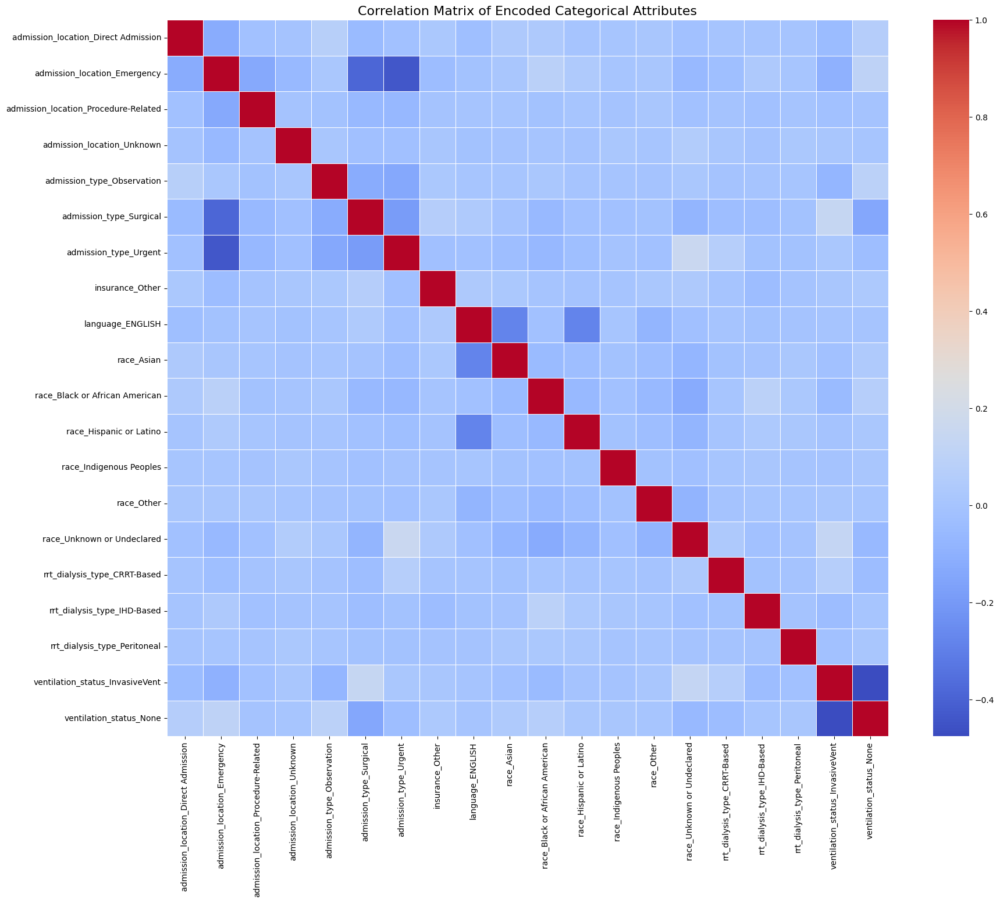

In [ ]:
# Compute the correlation matrix
correlation_matrix = encoded_categorical_attributes_cleaned.drop(columns=['stay_id']).corr()

# Plot the heatmap
plt.figure(figsize=(20, 16))
sns.heatmap(correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Encoded Categorical Attributes', fontsize=16)
plt.show()

## DUMMY ATTRIBUTES

In [ ]:
dummy_attributes.head()

,gender,rrt_dialysis_present,suspected_infection,sepsis3,myocardial_infarct,congestive_heart_failure,peripheral_vascular_disease,cerebrovascular_disease,dementia,chronic_pulmonary_disease,...,diabetes_without_cc,diabetes_with_cc,paraplegia,renal_disease,malignant_cancer,severe_liver_disease,metastatic_solid_tumor,aids,in_hospital_death,stay_id
1,0,0.0,1.0,0,1,1,0,0,0,0,...,1,0,0,1,0,0,0,0,1,39765666
2,0,0.0,0.0,0,0,0,0,0,0,1,...,0,0,0,0,0,0,0,0,0,31205490
3,0,0.0,1.0,1,1,1,1,0,0,1,...,0,1,0,0,0,0,0,0,0,39060235
4,0,0.0,1.0,1,1,1,0,0,0,0,...,0,0,0,1,1,0,0,0,1,33685454
9,1,0.0,1.0,1,1,1,0,0,0,0,...,1,0,0,0,0,0,0,0,0,36753294


In [ ]:
columns_to_drop = ['in_hospital_death']
dummy_attributes = dummy_attributes.drop(columns = columns_to_drop)

In [ ]:
print(dummy_attributes.shape)
dummy_attributes.columns

(27007, 22)


Index(['gender', 'rrt_dialysis_present', 'suspected_infection', 'sepsis3',
       'myocardial_infarct', 'congestive_heart_failure',
       'peripheral_vascular_disease', 'cerebrovascular_disease', 'dementia',
       'chronic_pulmonary_disease', 'rheumatic_disease',
       'peptic_ulcer_disease', 'mild_liver_disease', 'diabetes_without_cc',
       'diabetes_with_cc', 'paraplegia', 'renal_disease', 'malignant_cancer',
       'severe_liver_disease', 'metastatic_solid_tumor', 'aids', 'stay_id'],
      dtype='object')

## NUMERICAL ATTRIBUTES

In [ ]:
print(numerical_attributes.shape)
numerical_attributes.head()

(27007, 178)


,stay_id,age_at_icu_intime,gcs_min,gcs_eyes,gcs_verbal,gcs_motor,SOFA,vitals_heart_rate_min,vitals_heart_rate_max,vitals_heart_rate_mean,...,bg_art_glucose_max,bg_art_potassium_min,bg_art_potassium_max,bg_art_sodium_min,bg_art_sodium_max,oasis,sapsii,sirs,LODS,meld
1,39765666,76,15.0,4.0,5.0,6.0,2,68.0,80.0,73.636364,...,NaN,NaN,NaN,NaN,NaN,18,30,1,3,17.000
2,31205490,46,15.0,4.0,5.0,6.0,1,55.0,91.0,79.480000,...,NaN,NaN,NaN,NaN,NaN,18,23,3,2,6.000
3,39060235,57,15.0,3.0,0.0,6.0,4,80.0,105.0,94.636364,...,332.0,3.2,4.5,136.0,138.0,32,32,3,3,9.000
4,33685454,81,15.0,4.0,5.0,6.0,2,65.0,83.0,73.720000,...,NaN,NaN,NaN,NaN,NaN,29,31,1,2,8.000
9,36753294,81,15.0,4.0,5.0,6.0,3,83.0,133.0,106.552632,...,NaN,NaN,NaN,NaN,NaN,32,47,3,4,20.864


#### Split death and alive

In [ ]:
alive = mortality_data[mortality_data.in_hospital_death == 0]
death = mortality_data[mortality_data.in_hospital_death == 1]
print(alive.shape)
print(death.shape)

(18056, 3)
(8951, 3)


In [ ]:
alive_ids = set(alive['stay_id'].unique())
dead_ids = set(death['stay_id'].unique())

In [ ]:
numerical_attributes_alive = numerical_attributes[numerical_attributes['stay_id'].isin(alive_ids)]
numerical_attributes_death = numerical_attributes[numerical_attributes['stay_id'].isin(dead_ids)]

print(numerical_attributes_alive.shape)
print(numerical_attributes_death.shape)

(18056, 178)
(8951, 178)


#### Handling Outliers

In [ ]:
def remove_outliers(df, exclude_columns=None, remove=False):
    if exclude_columns is None:
        exclude_columns = []

    outlier_info = {}
    outlier_count = {index: 0 for index in df.index}

    for column in df.columns:
        if column in exclude_columns:
            continue

        Q1 = df[column].dropna().quantile(0.15)
        Q3 = df[column].dropna().quantile(0.85)
        IQR = Q3 - Q1

        lower_bound = Q1 - 1.5*IQR
        upper_bound = Q3 + 1.5*IQR

        outlier_info[column] = (lower_bound, upper_bound)

        is_outlier = ~df[column].between(lower_bound, upper_bound, inclusive='both') & ~df[column].isnull()
        for idx in is_outlier[is_outlier].index:
            outlier_count[idx] += 1

    if remove:
        indices_to_drop = [index for index, count in outlier_count.items() if count > 0]
        df = df.drop(index=indices_to_drop)

    return df, outlier_info

In [ ]:
exclude_cols = ['stay_id']
numerical_attributes_alive, outliers_thresholds = remove_outliers(numerical_attributes_alive, exclude_columns=exclude_cols, remove=True)
print(outliers_thresholds)

print(numerical_attributes_alive.shape)
numerical_attributes_alive.head()

{'age_at_icu_intime': (-13.5, 134.5), 'gcs_min': (10.0, 18.0), 'gcs_eyes': (-1.0, 7.0), 'gcs_verbal': (-7.5, 12.5), 'gcs_motor': (3.5, 7.5), 'SOFA': (-8.0, 16.0), 'vitals_heart_rate_min': (14.0, 126.0), 'vitals_heart_rate_max': (26.0, 178.0), 'vitals_heart_rate_mean': (23.66349016480595, 144.6969900762006), 'vitals_sbp_min': (33.0, 153.0), 'vitals_sbp_max': (64.0, 232.0), 'vitals_sbp_mean': (58.730022435897496, 179.3469711538461), 'vitals_dbp_min': (8.0, 88.0), 'vitals_dbp_max': (17.5, 157.5), 'vitals_dbp_mean': (21.717232142857142, 106.75699404761906), 'vitals_mbp_min': (18.25, 104.25), 'vitals_mbp_max': (36.0, 172.0), 'vitals_mbp_mean': (38.55448717948715, 120.86730769230772), 'vitals_resp_rate_min': (0.0, 24.0), 'vitals_resp_rate_max': (3.0, 51.0), 'vitals_resp_rate_mean': (5.557692307692305, 31.557692307692314), 'vitals_temperature_min': (34.055, 38.495), 'vitals_temperature_max': (35.135, 39.815000000000005), 'vitals_temperature_mean': (35.261428570999996, 38.564285715), 'vitals_s

,stay_id,age_at_icu_intime,gcs_min,gcs_eyes,gcs_verbal,gcs_motor,SOFA,vitals_heart_rate_min,vitals_heart_rate_max,vitals_heart_rate_mean,...,bg_art_glucose_max,bg_art_potassium_min,bg_art_potassium_max,bg_art_sodium_min,bg_art_sodium_max,oasis,sapsii,sirs,LODS,meld
2,31205490,46,15.0,4.0,5.0,6.0,1,55.0,91.0,79.480000,...,NaN,NaN,NaN,NaN,NaN,18,23,3,2,6.0
3,39060235,57,15.0,3.0,0.0,6.0,4,80.0,105.0,94.636364,...,332.0,3.2,4.5,136.0,138.0,32,32,3,3,9.0
10,31831386,56,15.0,2.0,0.0,5.0,7,59.0,97.0,72.560000,...,170.0,3.8,7.3,139.0,142.0,25,34,3,4,9.0
18,39635619,51,15.0,2.0,0.0,5.0,3,82.0,107.0,95.352941,...,NaN,NaN,NaN,NaN,NaN,34,26,3,4,21.0
21,34629895,78,14.0,3.0,5.0,6.0,3,65.0,103.0,82.794872,...,153.0,3.7,4.4,133.0,137.0,36,35,4,3,9.0


In [ ]:
exclude_cols = ['stay_id']
numerical_attributes_death, outliers_thresholds = remove_outliers(numerical_attributes_death, exclude_columns=exclude_cols, remove=True)
print(outliers_thresholds)

print(numerical_attributes_death.shape)
numerical_attributes_alive.head()

{'age_at_icu_intime': (7.0, 135.0), 'gcs_min': (5.0, 21.0), 'gcs_eyes': (-3.5, 8.5), 'gcs_verbal': (-7.5, 12.5), 'gcs_motor': (-4.0, 12.0), 'SOFA': (-10.0, 22.0), 'vitals_heart_rate_min': (5.5, 137.5), 'vitals_heart_rate_max': (15.5, 195.5), 'vitals_heart_rate_mean': (16.30559234563396, 156.96322844355126), 'vitals_sbp_min': (18.0, 162.0), 'vitals_sbp_max': (49.0, 249.0), 'vitals_sbp_mean': (46.20667025862072, 189.65554956896545), 'vitals_dbp_min': (-1.5, 90.5), 'vitals_dbp_max': (12.0, 164.0), 'vitals_dbp_mean': (17.60607001397951, 105.92241204566635), 'vitals_mbp_min': (6.5, 106.5), 'vitals_mbp_max': (25.5, 181.5), 'vitals_mbp_mean': (32.77062015503871, 121.20162790697678), 'vitals_resp_rate_min': (-3.0, 29.0), 'vitals_resp_rate_max': (2.5, 54.5), 'vitals_resp_rate_mean': (3.2754274193548394, 36.820165770609314), 'vitals_temperature_min': (33.730000000000004, 38.61), 'vitals_temperature_max': (34.58500000000001, 40.224999999999994), 'vitals_temperature_mean': (34.72413194525, 38.8668

,stay_id,age_at_icu_intime,gcs_min,gcs_eyes,gcs_verbal,gcs_motor,SOFA,vitals_heart_rate_min,vitals_heart_rate_max,vitals_heart_rate_mean,...,bg_art_glucose_max,bg_art_potassium_min,bg_art_potassium_max,bg_art_sodium_min,bg_art_sodium_max,oasis,sapsii,sirs,LODS,meld
2,31205490,46,15.0,4.0,5.0,6.0,1,55.0,91.0,79.480000,...,NaN,NaN,NaN,NaN,NaN,18,23,3,2,6.0
3,39060235,57,15.0,3.0,0.0,6.0,4,80.0,105.0,94.636364,...,332.0,3.2,4.5,136.0,138.0,32,32,3,3,9.0
10,31831386,56,15.0,2.0,0.0,5.0,7,59.0,97.0,72.560000,...,170.0,3.8,7.3,139.0,142.0,25,34,3,4,9.0
18,39635619,51,15.0,2.0,0.0,5.0,3,82.0,107.0,95.352941,...,NaN,NaN,NaN,NaN,NaN,34,26,3,4,21.0
21,34629895,78,14.0,3.0,5.0,6.0,3,65.0,103.0,82.794872,...,153.0,3.7,4.4,133.0,137.0,36,35,4,3,9.0


In [ ]:
numerical_attributes_alive_ids = set(numerical_attributes_alive['stay_id'].unique())
numerical_attributes_death_ids = set(numerical_attributes_death['stay_id'].unique())
combined_ids = numerical_attributes_alive_ids | numerical_attributes_death_ids

numerical_attributes_cleaned = numerical_attributes[numerical_attributes['stay_id'].isin(combined_ids)]
print(numerical_attributes_cleaned.shape)

(13068, 178)


#### DROPPING EXCESSIVE MISSING VALUES

In [ ]:
def list_columns_with_missing_values(df, threshold_percent):

    missing_counts = df.isna().sum()
    missing_percentage = (missing_counts / len(df)) * 100
    columns_above_threshold = missing_percentage[missing_percentage > threshold_percent].index.tolist()

    return columns_above_threshold

In [ ]:
threshold_percent = 40
columns_above_threshold = list_columns_with_missing_values(numerical_attributes_cleaned, threshold_percent)

print('Number of columns with more than {}% of NaN: {}'.format(threshold_percent, len(columns_above_threshold)))
print('Columns above threshold: ', columns_above_threshold)

Number of columns with more than 40% of NaN: 112
Columns above threshold:  ['lab_atyps_min', 'lab_atyps_max', 'lab_bands_min', 'lab_bands_max', 'lab_imm_granulocytes_min', 'lab_imm_granulocytes_max', 'lab_metas_min', 'lab_metas_max', 'lab_nrbc_min', 'lab_nrbc_max', 'lab_d_dimer_min', 'lab_d_dimer_max', 'lab_fibrinogen_min', 'lab_fibrinogen_max', 'lab_thrombin_min', 'lab_thrombin_max', 'lab_alt_min', 'lab_alt_max', 'lab_alp_min', 'lab_alp_max', 'lab_ast_min', 'lab_ast_max', 'lab_amylase_min', 'lab_amylase_max', 'lab_bilirubin_total_min', 'lab_bilirubin_total_max', 'lab_bilirubin_direct_min', 'lab_bilirubin_direct_max', 'lab_bilirubin_indirect_min', 'lab_bilirubin_indirect_max', 'lab_ck_cpk_min', 'lab_ck_cpk_max', 'lab_ck_mb_min', 'lab_ck_mb_max', 'lab_ggt_min', 'lab_ggt_max', 'lab_ld_ldh_min', 'lab_ld_ldh_max', 'bg_lactate_min', 'bg_lactate_max', 'bg_so2_min', 'bg_so2_max', 'bg_aado2_min', 'bg_aado2_max', 'bg_aado2_calc_min', 'bg_aado2_calc_max', 'bg_pao2fio2ratio_min', 'bg_pao2fio2rati

In [ ]:
# Drop columns and clean the DataFrame
numerical_attributes_cleaned = numerical_attributes_cleaned.drop(columns = columns_above_threshold)

print("Shape of cleaned DataFrame:", numerical_attributes_cleaned.shape)

Shape of cleaned DataFrame: (13068, 66)


In [ ]:
# # remove correlated features
# numerical_attributes_cleaned = numerical_attributes_cleaned.drop(columns = ['lab_pt_min', 'lab_abs_lymphocytes_max','vitals_mbp_mean','bg_totalco2_min','bg_baseexcess_min','bg_baseexcess_max',
#                                                                             'bg_totalco2_max', 'vitals_heart_rate_mean', 'vitals_temperature_mean', 'lab_abs_neutrophils_max','bg_po2_max','vitals_glucose_max','vitals_glucose_min',
#                                                                             'lab_inr_max','lab_pt_max','lab_abs_monocytes_max','lab_abs_eosinophils_min']) # dropped beacuse of the high correlation

In [ ]:
# Descriptive Statistics
pd.set_option('display.max_columns', None)
descriptive_stats = numerical_attributes_cleaned.describe()
print("Descriptive Statistics for Numerical Attributes:\n", descriptive_stats)

Descriptive Statistics for Numerical Attributes:
             stay_id  age_at_icu_intime       gcs_min      gcs_eyes  \
count  1.306800e+04       13068.000000  13038.000000  12987.000000   
mean   3.496257e+07          64.748852     14.179399      3.266189   
std    2.907047e+06          16.818779      1.607620      0.813826   
min    3.000166e+07          18.000000      5.000000      1.000000   
25%    3.241842e+07          55.000000     14.000000      3.000000   
50%    3.496117e+07          66.000000     15.000000      3.000000   
75%    3.748866e+07          77.000000     15.000000      4.000000   
max    3.999801e+07          98.000000     15.000000      4.000000   

         gcs_verbal     gcs_motor         SOFA  vitals_heart_rate_min  \
count  12952.000000  12943.000000  13068.00000           13049.000000   
mean       3.104463      5.659971      3.70753              68.438808   
std        2.241460      0.845257      2.54979              13.747569   
min        0.000000      1.

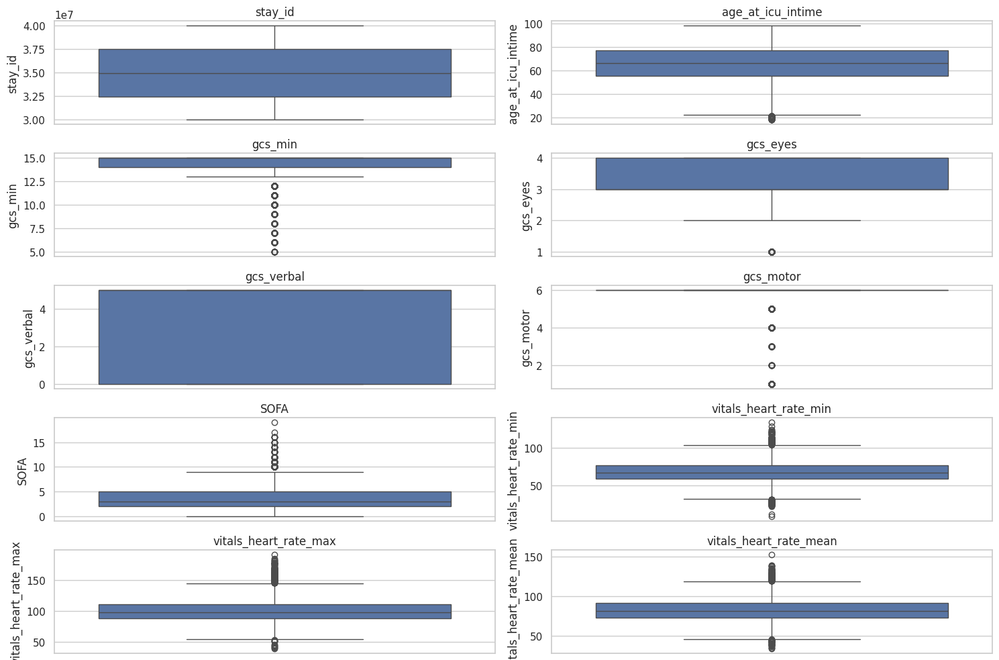

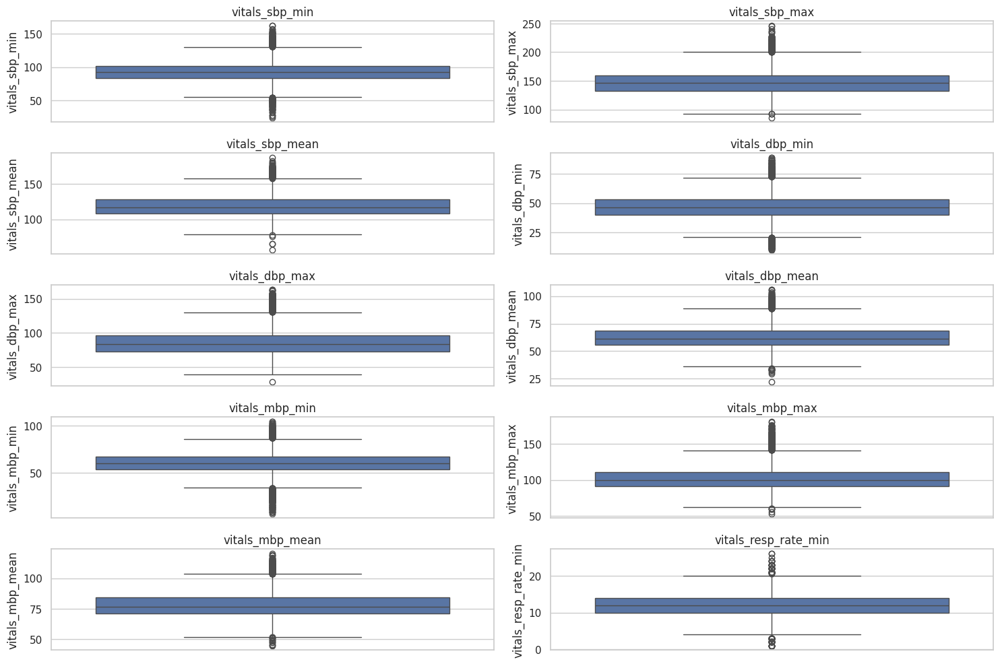

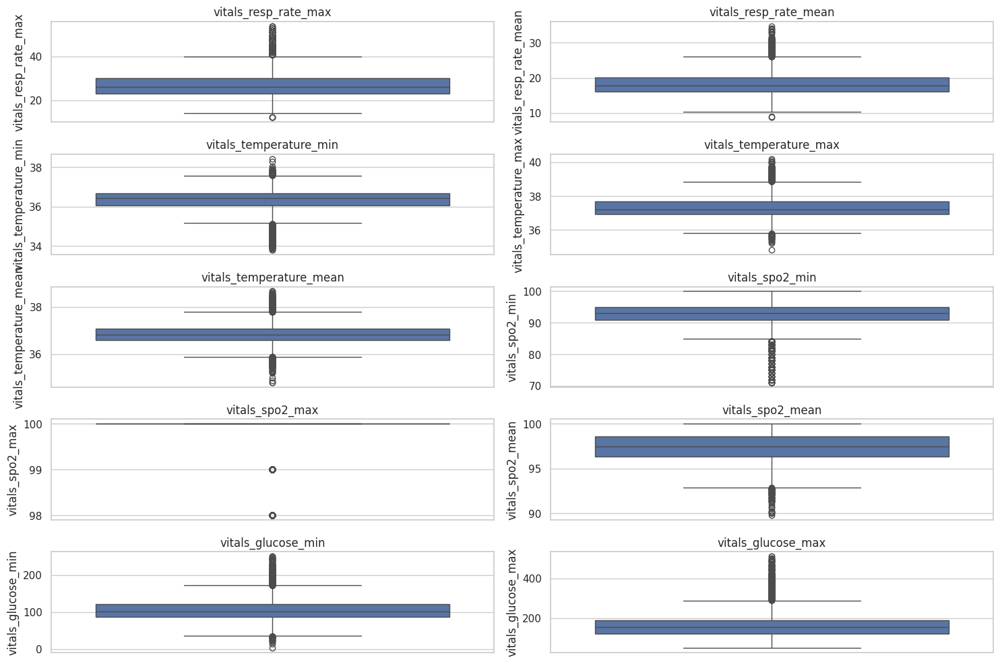

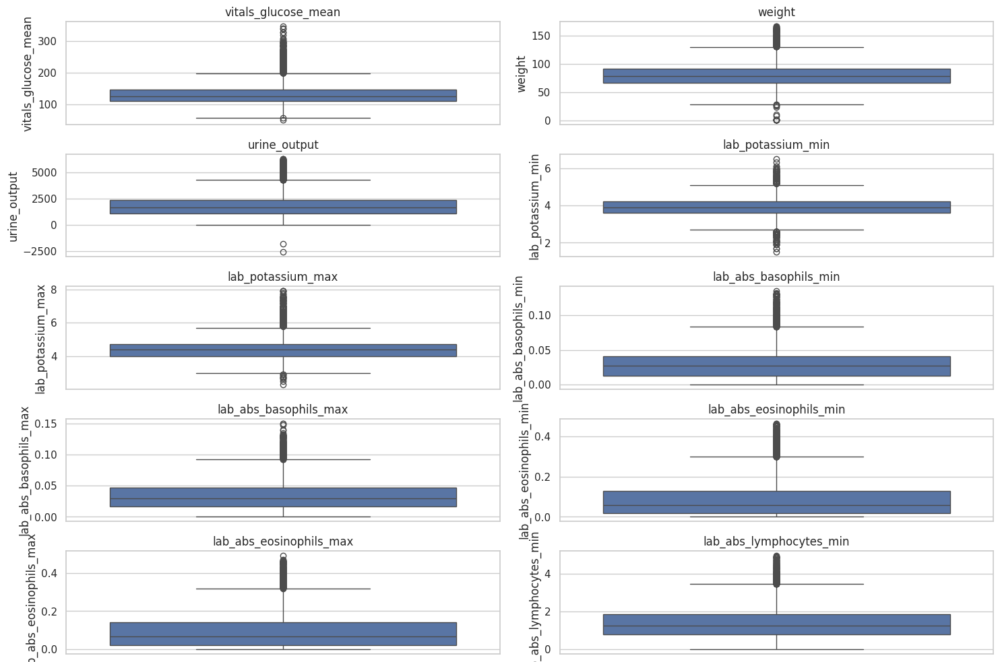

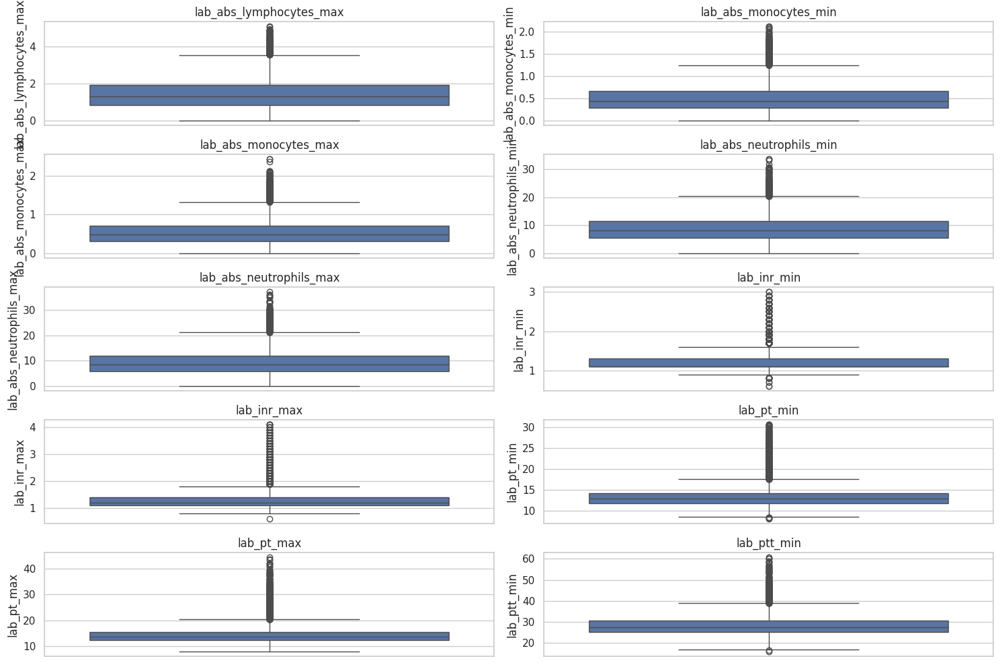

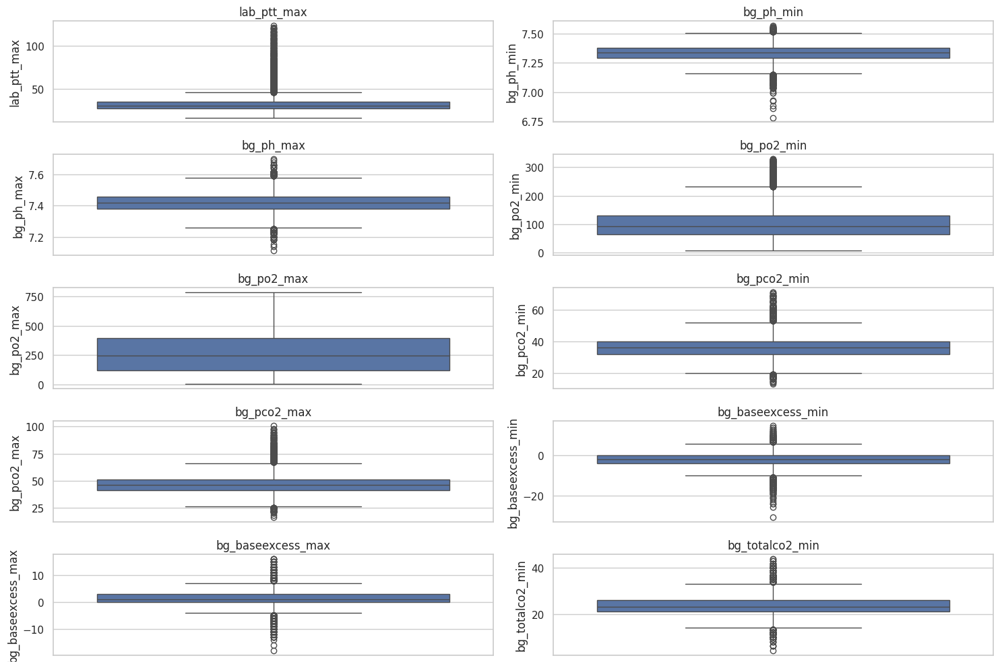

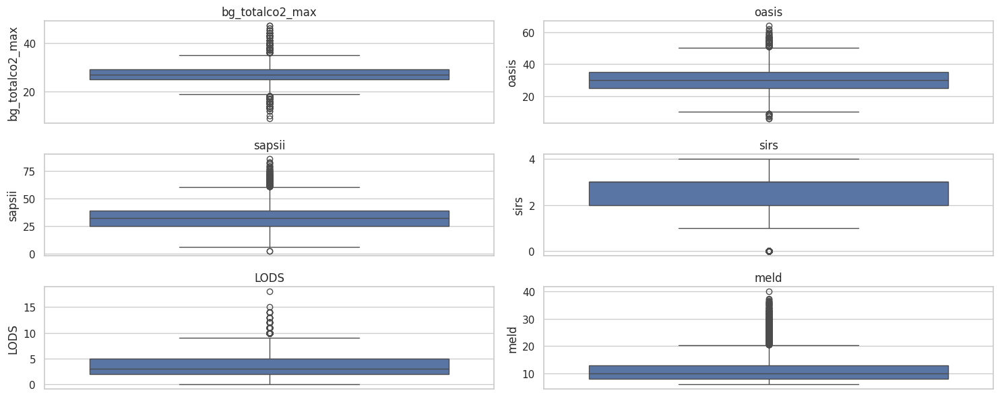

In [ ]:
# Boxplots for the numerical attributes
sns.set(style="whitegrid")

num_attributes_per_fig = 10
total_attributes = numerical_attributes_cleaned.shape[1]
total_figs = (total_attributes + num_attributes_per_fig - 1) // num_attributes_per_fig

for i in range(total_figs):
    start_index = i * num_attributes_per_fig
    end_index = min(start_index + num_attributes_per_fig, total_attributes)
    selected_columns = numerical_attributes_cleaned.columns[start_index:end_index]

    plt.figure(figsize=(15, 10))

    for j, column in enumerate(selected_columns, 1):
        plt.subplot(5, 2, j)
        sns.boxplot(y=numerical_attributes_cleaned[column])
        plt.title(column)

    plt.tight_layout()
    plt.show()

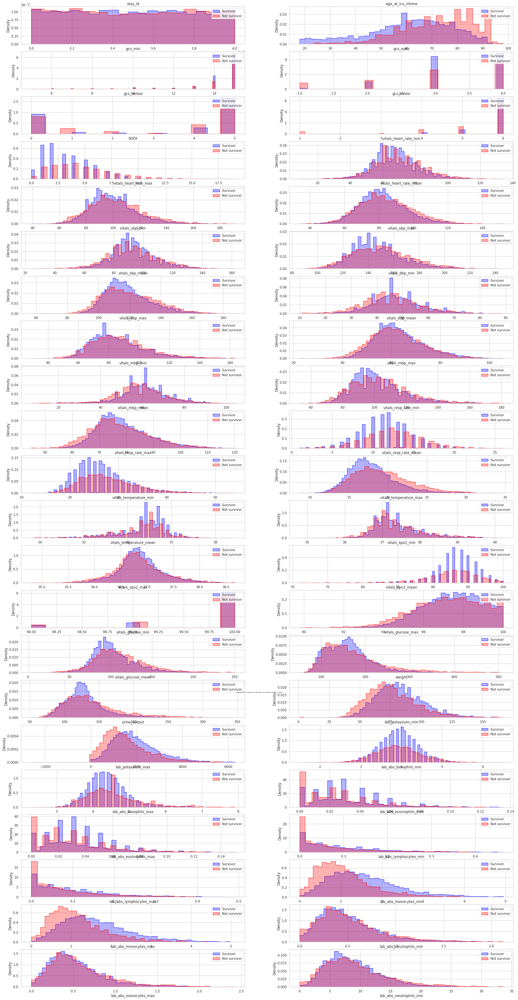

In [ ]:
%matplotlib inline

# Comparison of the numerical variables' distributions in respect to their target variable ('in_hospital_death')
X0 = numerical_attributes_cleaned[mortality_data['in_hospital_death'] == 0]  # Survived
X1 = numerical_attributes_cleaned[mortality_data['in_hospital_death'] == 1]  # Deceased

fig, axes = plt.subplots(ncols=2, nrows=int(np.ceil(len(numerical_attributes_cleaned.columns) / 3)), figsize=(30, 16))
fig.tight_layout(pad=20)

for i, ax in zip(range(len(numerical_attributes_cleaned.columns)), axes.flat):
    sns.histplot(X0.iloc[:, i], color="blue", ax=ax, stat='density', element="step", alpha=0.3, label='Survivor')
    sns.histplot(X1.iloc[:, i], color="red", ax=ax, stat='density', element="step", alpha=0.3, label='Not survivor')
    ax.set_title(numerical_attributes_cleaned.columns[i])
    ax.legend()

plt.subplots_adjust(top=3)
fig.suptitle('Distribution of Numerical Variables by Mortality within 7 Days', fontsize=5)
plt.show()

<Axes: >

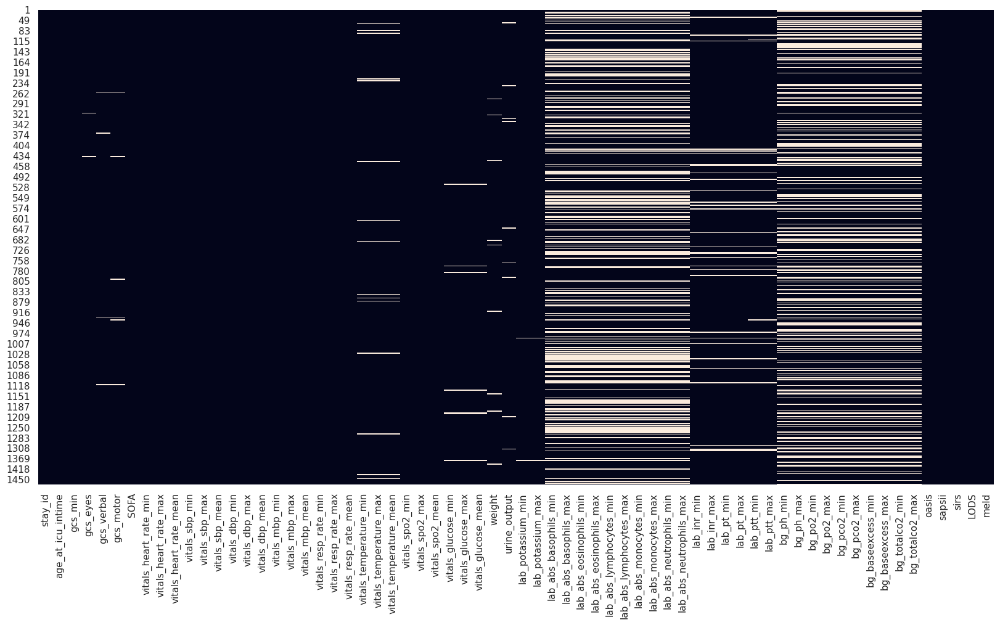

In [ ]:
sns.set(rc={"figure.figsize":(20, 10)})
sns.heatmap(numerical_attributes_cleaned[:500].isnull(), cbar=False)

#### Imputation of Missing Values

In [ ]:
from sklearn.impute import SimpleImputer, KNNImputer
from sklearn.model_selection import KFold
from sklearn.metrics import mean_squared_error

In [ ]:
# Check for missing values in each column
missing_data = numerical_attributes_cleaned.isnull().sum()
print("Missing data in each column:\n", missing_data[missing_data > 1000])

Missing data in each column:
 lab_abs_basophils_min      4318
lab_abs_basophils_max      4318
lab_abs_eosinophils_min    4318
lab_abs_eosinophils_max    4318
lab_abs_lymphocytes_min    4316
lab_abs_lymphocytes_max    4316
lab_abs_monocytes_min      4318
lab_abs_monocytes_max      4318
lab_abs_neutrophils_min    4318
lab_abs_neutrophils_max    4318
bg_ph_min                  4224
bg_ph_max                  4224
bg_po2_min                 4222
bg_po2_max                 4222
bg_pco2_min                4222
bg_pco2_max                4222
bg_baseexcess_min          4222
bg_baseexcess_max          4222
bg_totalco2_min            4222
bg_totalco2_max            4222
dtype: int64


In [ ]:
knn_imputer = KNNImputer(n_neighbors=5, weights="uniform")

numerical_attributes_imputed = pd.DataFrame(knn_imputer.fit_transform(numerical_attributes_cleaned), columns=numerical_attributes_cleaned.columns)

print(numerical_attributes_imputed.shape)
numerical_attributes_imputed.head()

(13068, 66)


,stay_id,age_at_icu_intime,gcs_min,gcs_eyes,gcs_verbal,gcs_motor,SOFA,vitals_heart_rate_min,vitals_heart_rate_max,vitals_heart_rate_mean,vitals_sbp_min,vitals_sbp_max,vitals_sbp_mean,vitals_dbp_min,vitals_dbp_max,vitals_dbp_mean,vitals_mbp_min,vitals_mbp_max,vitals_mbp_mean,vitals_resp_rate_min,vitals_resp_rate_max,vitals_resp_rate_mean,vitals_temperature_min,vitals_temperature_max,vitals_temperature_mean,vitals_spo2_min,vitals_spo2_max,vitals_spo2_mean,vitals_glucose_min,vitals_glucose_max,vitals_glucose_mean,weight,urine_output,lab_potassium_min,lab_potassium_max,lab_abs_basophils_min,lab_abs_basophils_max,lab_abs_eosinophils_min,lab_abs_eosinophils_max,lab_abs_lymphocytes_min,lab_abs_lymphocytes_max,lab_abs_monocytes_min,lab_abs_monocytes_max,lab_abs_neutrophils_min,lab_abs_neutrophils_max,lab_inr_min,lab_inr_max,lab_pt_min,lab_pt_max,lab_ptt_min,lab_ptt_max,bg_ph_min,bg_ph_max,bg_po2_min,bg_po2_max,bg_pco2_min,bg_pco2_max,bg_baseexcess_min,bg_baseexcess_max,bg_totalco2_min,bg_totalco2_max,oasis,sapsii,sirs,LODS,meld
0,39765666.0,76.0,15.0,4.0,5.0,6.0,2.0,68.0,80.0,73.636364,130.0,158.0,142.454545,69.0,127.0,83.272727,83.0,135.0,97.545455,14.0,25.5,20.681818,36.50,37.06,36.743333,96.0,100.0,98.909091,109.0,110.0,109.500000,76.2,3900.0,3.9,4.2,0.02120,0.02120,0.14310,0.14310,1.38860,1.38860,0.27560,0.27560,3.47680,3.47680,1.1,1.3,11.5,14.5,24.9,69.6,7.310,7.424,134.2,282.4,39.8,50.2,-1.6,2.2,25.4,28.0,18.0,30.0,1.0,3.0,17.0
1,31205490.0,46.0,15.0,4.0,5.0,6.0,1.0,55.0,91.0,79.480000,73.0,115.0,97.760000,45.0,83.0,59.840000,54.0,91.0,68.360000,13.0,21.0,17.360000,36.39,36.83,36.556000,94.0,100.0,98.125000,146.0,161.0,153.000000,72.2,1965.0,3.5,3.9,0.05100,0.05100,0.01700,0.01700,0.73100,0.73100,0.11900,0.11900,16.06500,16.06500,1.0,1.0,11.0,11.3,29.4,31.8,7.322,7.442,128.0,342.8,35.0,44.6,-3.4,1.4,22.4,26.4,18.0,23.0,3.0,2.0,6.0
2,39060235.0,57.0,15.0,3.0,0.0,6.0,4.0,80.0,105.0,94.636364,80.0,147.5,111.865385,50.5,79.0,61.596154,41.0,100.5,75.980000,11.0,23.0,15.409091,36.22,37.70,37.242353,92.0,100.0,97.050000,98.0,216.0,138.052632,96.0,1640.0,4.0,4.7,0.03846,0.03846,0.09636,0.09636,1.74384,1.74384,0.36986,0.36986,6.39548,6.39548,1.0,1.2,11.3,12.7,25.4,27.2,7.270,7.400,90.0,462.0,41.0,56.0,-4.0,0.0,23.0,27.0,32.0,32.0,3.0,3.0,9.0
3,31831386.0,56.0,15.0,2.0,0.0,5.0,7.0,59.0,97.0,72.560000,93.0,129.0,108.076923,49.0,68.0,58.153846,64.0,89.0,73.923077,8.5,21.0,14.910714,36.39,36.39,36.390000,92.0,100.0,98.000000,88.0,162.0,115.150000,91.0,2925.0,5.0,5.0,0.04866,0.04966,0.04766,0.04770,1.19160,1.20760,0.97806,0.99534,10.40438,10.47398,1.2,1.3,13.7,14.7,29.9,31.9,7.240,7.370,95.0,340.0,36.0,57.0,-5.0,0.0,20.0,26.0,25.0,34.0,3.0,4.0,9.0
4,39635619.0,51.0,15.0,2.0,0.0,5.0,3.0,82.0,107.0,95.352941,112.0,181.0,147.878788,50.0,112.0,78.272727,65.0,128.0,93.636364,13.0,31.0,21.838235,36.94,38.50,37.815714,90.0,100.0,95.735294,86.0,94.0,91.000000,112.5,3625.0,3.4,3.7,0.02220,0.02220,0.28120,0.28120,0.65120,0.65120,0.39220,0.39220,6.05320,6.05320,1.3,1.3,14.6,14.6,34.1,34.1,7.430,7.430,100.0,100.0,38.0,38.0,0.0,0.0,26.0,26.0,34.0,26.0,3.0,4.0,21.0


In [ ]:
# numerical_attributes_imputed = numerical_attributes_cleaned.dropna()
# numerical_attributes_imputed.shape

#### Standardization

In [ ]:
from sklearn.preprocessing import StandardScaler, MinMaxScaler, RobustScaler

In [ ]:
id_data = numerical_attributes_imputed[['stay_id']]

data_to_scale = numerical_attributes_imputed.drop(columns=['stay_id'])
print(data_to_scale.shape)

(13068, 65)


In [ ]:
# Initialize scalers
standard_scaler = StandardScaler()
minmax_scaler = MinMaxScaler()
robust_scaler = RobustScaler()

# Fit and transform the data
standard_scaled_data = standard_scaler.fit_transform(data_to_scale)
minmax_scaled_data = minmax_scaler.fit_transform(data_to_scale)
robust_scaled_data = robust_scaler.fit_transform(data_to_scale)

# Convert arrays back to DataFrame for easier handling
standard_scaled_df = pd.DataFrame(standard_scaled_data, columns=data_to_scale.columns)
minmax_scaled_df = pd.DataFrame(minmax_scaled_data, columns=data_to_scale.columns)
robust_scaled_df = pd.DataFrame(robust_scaled_data, columns=data_to_scale.columns)

# Descriptive statistics comparison
print("Standard Scaled Data:\n", standard_scaled_df.shape)
print("Min-Max Scaled Data:\n", minmax_scaled_df.shape)
print("Robust Scaled Data:\n", robust_scaled_df.shape)

Standard Scaled Data:
 (13068, 65)
Min-Max Scaled Data:
 (13068, 65)
Robust Scaled Data:
 (13068, 65)


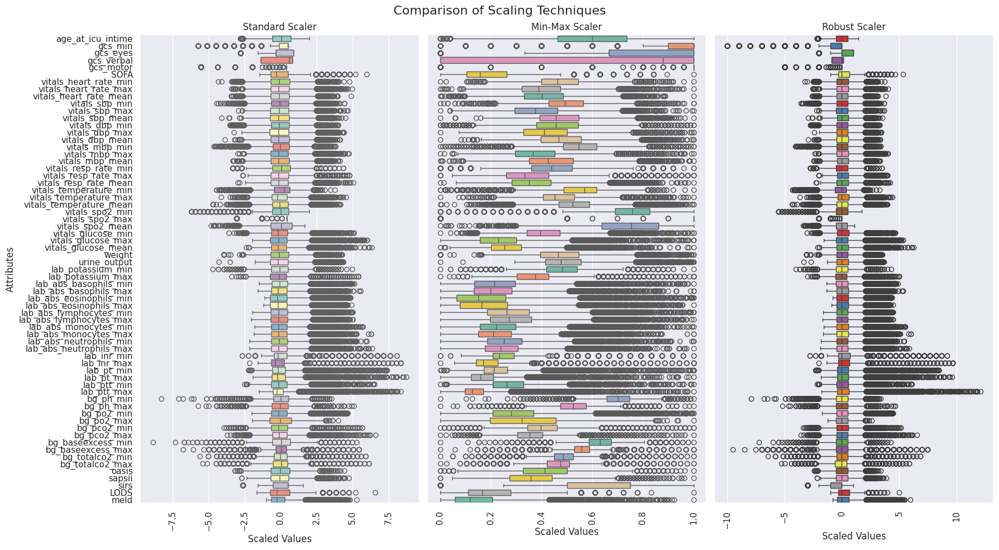

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 10), sharey=True)
fig.suptitle('Comparison of Scaling Techniques', fontsize=16)
plt.style.use('default')

# Set the background color to white
fig.patch.set_facecolor('white')
plt.rcParams['axes.facecolor'] = 'white'

# Standard Scaled
sns.boxplot(data=standard_scaled_df, ax=axes[0], orient='h', palette="Set3").set_title('Standard Scaler')
axes[0].set_xlabel('Scaled Values')
axes[0].set_ylabel('Attributes')
axes[0].tick_params(axis='x', rotation=90)

# Min-Max Scaled
sns.boxplot(data=minmax_scaled_df, ax=axes[1], orient='h', palette="Set2").set_title('Min-Max Scaler')
axes[1].set_xlabel('Scaled Values')
axes[1].set_ylabel('')
axes[1].tick_params(axis='x', rotation=90)

# Robust Scaled
sns.boxplot(data=robust_scaled_df, ax=axes[2], orient='h', palette="Set1").set_title('Robust Scaler')
axes[2].set_xlabel('Scaled Values')
axes[2].set_ylabel('')
axes[2].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

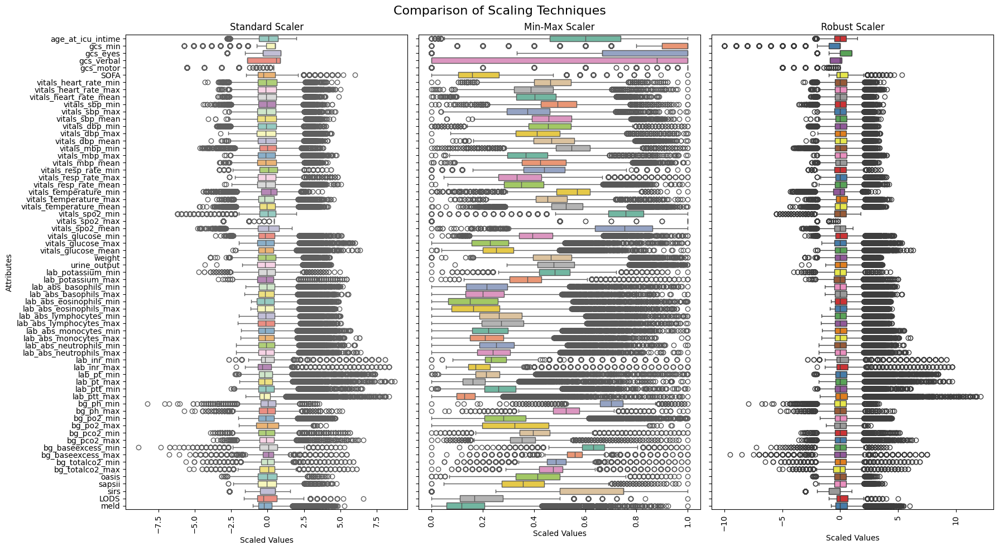

In [ ]:
fig, axes = plt.subplots(1, 3, figsize=(18, 10), sharey=True)
fig.suptitle('Comparison of Scaling Techniques', fontsize=16)
plt.style.use('default')

# Set the background color to white
fig.patch.set_facecolor('white')
plt.rcParams['axes.facecolor'] = 'white'

# Standard Scaled
sns.boxplot(data=standard_scaled_df, ax=axes[0], orient='h', palette="Set3").set_title('Standard Scaler')
axes[0].set_xlabel('Scaled Values')
axes[0].set_ylabel('Attributes')
axes[0].tick_params(axis='x', rotation=90)

# Min-Max Scaled
sns.boxplot(data=minmax_scaled_df, ax=axes[1], orient='h', palette="Set2").set_title('Min-Max Scaler')
axes[1].set_xlabel('Scaled Values')
axes[1].set_ylabel('')
axes[1].tick_params(axis='x', rotation=90)

# Robust Scaled
sns.boxplot(data=robust_scaled_df, ax=axes[2], orient='h', palette="Set1").set_title('Robust Scaler')
axes[2].set_xlabel('Scaled Values')
axes[2].set_ylabel('')
axes[2].tick_params(axis='x', rotation=90)

plt.tight_layout()
plt.show()

In [ ]:
robust_scaled_df = pd.concat([id_data.reset_index(drop=True), robust_scaled_df.reset_index(drop=True)], axis=1)

# Verify structure
print(robust_scaled_df.shape)
robust_scaled_df.head()

(13068, 66)


,stay_id,age_at_icu_intime,gcs_min,gcs_eyes,gcs_verbal,gcs_motor,SOFA,vitals_heart_rate_min,vitals_heart_rate_max,vitals_heart_rate_mean,vitals_sbp_min,vitals_sbp_max,vitals_sbp_mean,vitals_dbp_min,vitals_dbp_max,vitals_dbp_mean,vitals_mbp_min,vitals_mbp_max,vitals_mbp_mean,vitals_resp_rate_min,vitals_resp_rate_max,vitals_resp_rate_mean,vitals_temperature_min,vitals_temperature_max,vitals_temperature_mean,vitals_spo2_min,vitals_spo2_max,vitals_spo2_mean,vitals_glucose_min,vitals_glucose_max,vitals_glucose_mean,weight,urine_output,lab_potassium_min,lab_potassium_max,lab_abs_basophils_min,lab_abs_basophils_max,lab_abs_eosinophils_min,lab_abs_eosinophils_max,lab_abs_lymphocytes_min,lab_abs_lymphocytes_max,lab_abs_monocytes_min,lab_abs_monocytes_max,lab_abs_neutrophils_min,lab_abs_neutrophils_max,lab_inr_min,lab_inr_max,lab_pt_min,lab_pt_max,lab_ptt_min,lab_ptt_max,bg_ph_min,bg_ph_max,bg_po2_min,bg_po2_max,bg_pco2_min,bg_pco2_max,bg_baseexcess_min,bg_baseexcess_max,bg_totalco2_min,bg_totalco2_max,oasis,sapsii,sirs,LODS,meld
0,39765666.0,0.454545,0.0,1.0,0.12,0.0,-0.333333,0.055556,-0.782609,-0.424906,2.000000,0.444444,1.288454,1.769231,1.869565,1.659300,1.769231,1.750,1.599988,0.500,-0.071429,0.710535,0.098361,-0.292537,-0.175739,0.75,0.0,0.622859,0.25000,-0.712121,-0.485714,-0.072792,1.791280,0.000000,-0.285714,-0.361751,-0.392507,0.812222,0.689128,0.102001,0.006803,-0.652908,-0.730613,-1.081864,-1.125836,-0.3,0.333333,-0.619048,0.221519,-0.507407,5.116883,-0.342857,0.066667,0.719231,0.126463,0.558824,0.500000,0.10,0.6,0.666667,0.294118,-1.2,-0.142857,-2.0,0.000000,1.4
1,31205490.0,-0.909091,0.0,1.0,0.12,0.0,-0.666667,-0.666667,-0.304348,-0.106054,-1.000000,-1.148148,-0.932393,-0.076923,-0.043478,-0.123360,-0.461538,-0.450,-0.650107,0.250,-0.714286,-0.118070,-0.081967,-0.635821,-0.578863,0.25,0.0,0.280764,1.40625,0.060606,0.757143,-0.231901,0.264352,-0.666667,-0.714286,1.011521,0.936664,-0.588889,-0.688036,-0.704588,-0.783582,-1.178861,-1.225290,1.655326,1.501574,-0.8,-0.666667,-0.857143,-0.791139,0.325926,0.207792,-0.171429,0.366667,0.600000,0.427184,-0.147059,-0.166667,-0.35,0.2,-0.333333,-0.176471,-1.2,-0.642857,0.0,-0.333333,-0.8
2,39060235.0,-0.409091,0.0,0.0,-0.88,0.0,0.333333,0.722222,0.304348,0.720938,-0.631579,0.055556,-0.231504,0.346154,-0.217391,0.010241,-1.461538,0.025,-0.062632,-0.250,-0.428571,-0.604711,-0.360656,0.662687,0.898105,-0.25,0.0,-0.188253,-0.09375,0.893939,0.330075,0.714797,0.007891,0.166667,0.428571,0.433641,0.377342,0.292889,0.178671,0.537726,0.433774,-0.336328,-0.432858,-0.447224,-0.516649,-0.8,0.000000,-0.714286,-0.348101,-0.414815,-0.389610,-0.914286,-0.333333,-0.130769,1.020662,0.735294,1.190476,-0.50,-0.5,-0.133333,0.000000,0.2,0.000000,0.0,0.000000,-0.2
3,31831386.0,-0.454545,0.0,-1.0,-0.88,-1.0,1.333333,-0.444444,-0.043478,-0.483637,0.052632,-0.629630,-0.419751,0.230769,-0.695652,-0.251635,0.307692,-0.550,-0.221213,-0.875,-0.714286,-0.729027,-0.081967,-1.292537,-0.936079,-0.25,0.0,0.226227,-0.40625,0.075758,-0.324286,0.515911,1.021898,1.833333,0.857143,0.903687,0.876896,-0.248222,-0.352755,-0.139632,-0.210745,1.706359,1.542945,0.424475,0.334616,0.2,0.333333,0.428571,0.284810,0.418519,0.220779,-1.342857,-0.833333,-0.034615,0.413244,0.000000,1.309524,-0.75,-0.5,-1.133333,-0.294118,-0.5,0.142857,0.0,0.333333,-0.2
4,39635619.0,-0.681818,0.0,-1.0,-0.88,-1.0,0.000000,0.833333,0.391304,0.760037,1.052632,1.296296,1.557982,0.307692,1.217391,1.278922,0.384615,1.400,1.298611,0.250,0.714286,0.998996,0.819672,1.856716,2.131925,-0.75,0.0,-0.761853,-0.46875,-0.954545,-1.014286,1.371122,1.574275,-0.833333,-1.000000,-0.315668,-0.347904,2.346667,2.197346,-0.802468,-0.879495,-0.261297,-0.362290,-0.521650,-0.588090,0.7,0.333333,0.857143,0.253165,1.196296,0.506494,1.371429,0.166667,0.061538,-0.781678,0.294118,-0.952381,0.50,-0.5,0.866667,-0.294118,0.4,-0.428571,0.0,0.333333,2.2


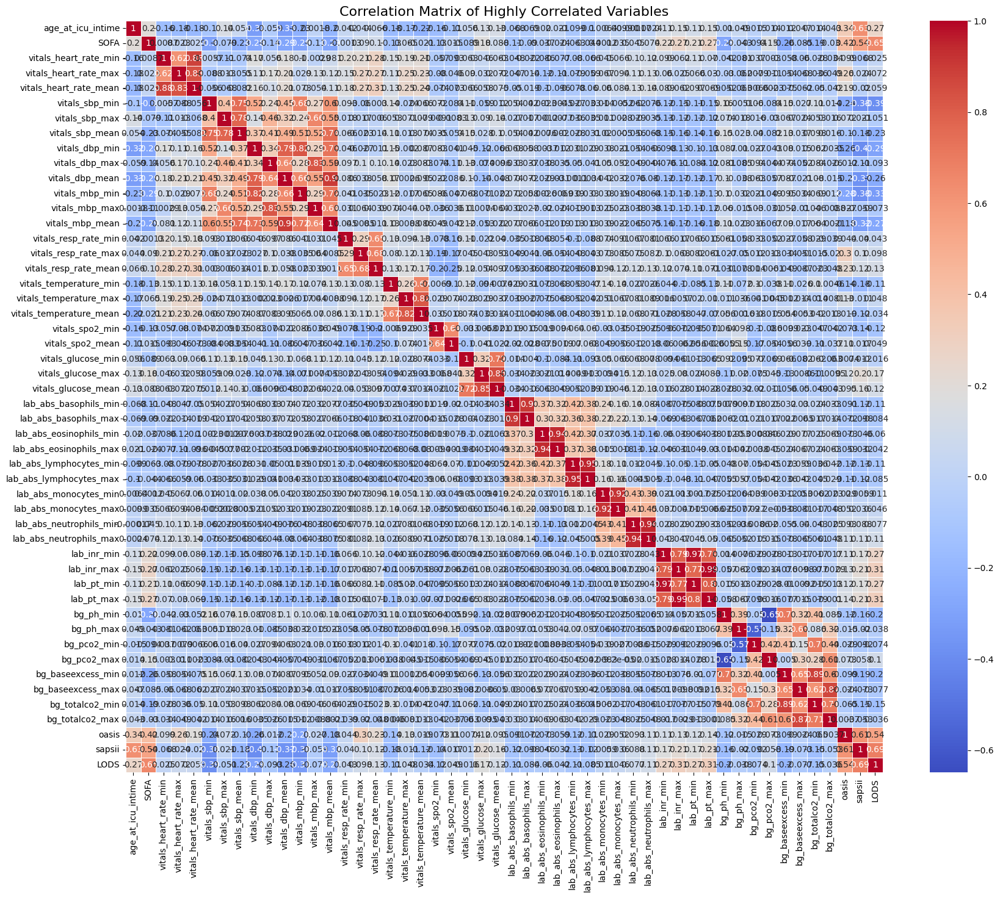

In [ ]:
# Compute the correlation matrix
correlation_matrix = robust_scaled_df.corr().abs()

# Identify the highly correlated variables (absolute correlation > 0.6)
# Ignore the diagonal by using np.fill_diagonal
np.fill_diagonal(correlation_matrix.values, 0)
highly_correlated_vars = correlation_matrix.columns[(correlation_matrix > 0.6).any()]

# Subset the DataFrame to include only these highly correlated variables
subset_df = robust_scaled_df[highly_correlated_vars]

# Compute the full correlation matrix for the subset
subset_correlation_matrix = subset_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 16))

# Draw the heatmap
sns.heatmap(subset_correlation_matrix, annot=True, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Highly Correlated Variables', fontsize=16)
plt.show()

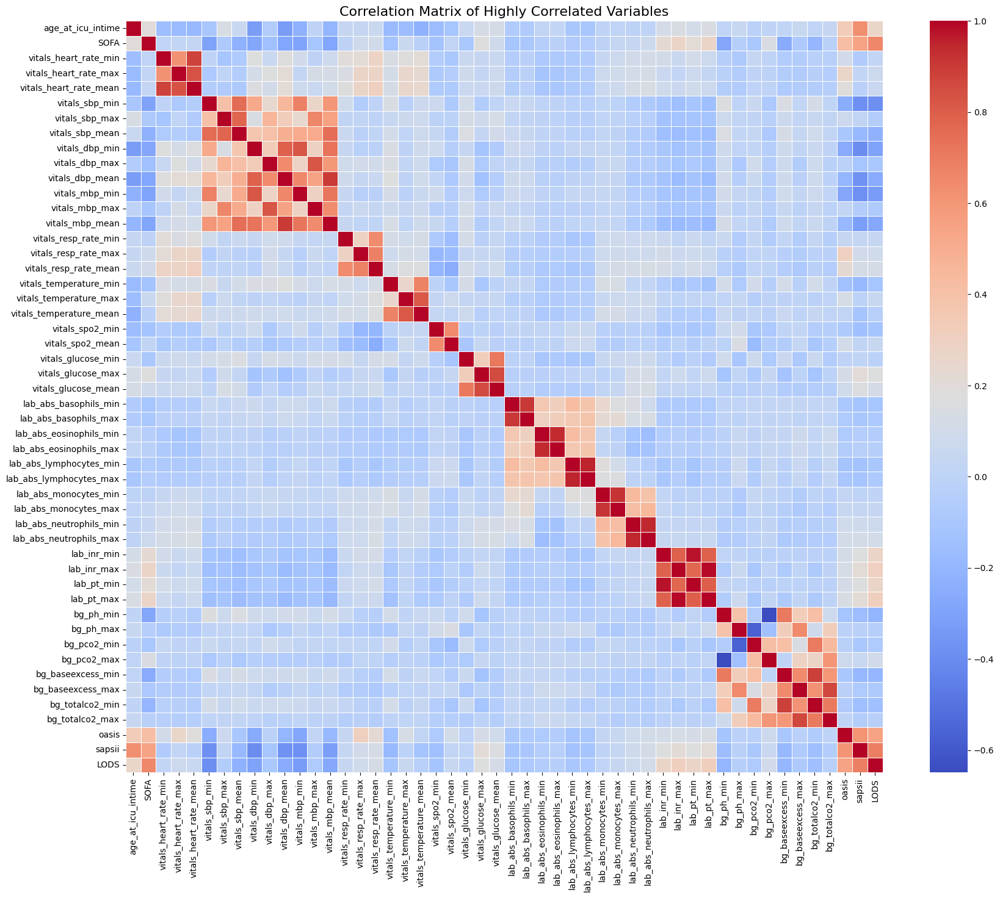

In [ ]:
correlation_matrix = robust_scaled_df.corr().abs()

# Identify the highly correlated variables (absolute correlation > 0.6)
# Ignore the diagonal by using np.fill_diagonal
np.fill_diagonal(correlation_matrix.values, 0)
highly_correlated_vars = correlation_matrix.columns[(correlation_matrix > 0.6).any()]

# Subset the DataFrame to include only these highly correlated variables
subset_df = robust_scaled_df[highly_correlated_vars]

# Compute the full correlation matrix for the subset
subset_correlation_matrix = subset_df.corr()

# Set up the matplotlib figure
plt.figure(figsize=(20, 16))

# Draw the heatmap without annotations
sns.heatmap(subset_correlation_matrix, annot=False, cmap='coolwarm', fmt=".2f", linewidths=0.5)
plt.title('Correlation Matrix of Highly Correlated Variables', fontsize=16)
plt.show()

#### Merging di df_pca_transformed

In [ ]:
def rename_columns(df, suffix, key='stay_id'):
    df = df.copy()
    df.columns = [f"{col}_{suffix}" if col != key else col for col in df.columns]
    return df

In [ ]:
pca_transformed_diagnoses = rename_columns(pca_transformed_diagnoses, 'diag')
pca_transformed_procedures = rename_columns(pca_transformed_procedures, 'proc')
pca_transformed_prescriptions = rename_columns(pca_transformed_prescriptions, 'pres')

In [ ]:
merged_df = pd.merge(robust_scaled_df, pca_transformed_diagnoses, on='stay_id', how='inner')
merged_df = pd.merge(merged_df, pca_transformed_procedures, on='stay_id', how='inner')
merged_df = pd.merge(merged_df, pca_transformed_prescriptions, on='stay_id', how='inner')

print("Shape of the merged DataFrame:", merged_df.shape)
merged_df.head()

Shape of the merged DataFrame: (13068, 309)


,stay_id,age_at_icu_intime,gcs_min,gcs_eyes,gcs_verbal,gcs_motor,SOFA,vitals_heart_rate_min,vitals_heart_rate_max,vitals_sbp_min,vitals_sbp_max,vitals_sbp_mean,vitals_dbp_min,vitals_dbp_max,vitals_dbp_mean,vitals_mbp_min,vitals_mbp_max,vitals_resp_rate_min,vitals_resp_rate_max,vitals_resp_rate_mean,vitals_temperature_min,vitals_temperature_max,vitals_spo2_min,vitals_spo2_max,vitals_spo2_mean,vitals_glucose_mean,weight,urine_output,lab_potassium_min,lab_potassium_max,lab_abs_basophils_min,lab_abs_basophils_max,lab_abs_eosinophils_max,lab_abs_lymphocytes_min,lab_abs_monocytes_min,lab_abs_neutrophils_min,lab_inr_min,lab_ptt_min,lab_ptt_max,bg_ph_min,bg_ph_max,bg_po2_min,bg_pco2_min,bg_pco2_max,oasis,sapsii,sirs,LODS,meld,0_diag,1_diag,2_diag,3_diag,4_diag,5_diag,6_diag,7_diag,8_diag,9_diag,10_diag,11_diag,12_diag,13_diag,14_diag,15_diag,16_diag,17_diag,18_diag,19_diag,20_diag,21_diag,22_diag,23_diag,24_diag,25_diag,26_diag,27_diag,28_diag,29_diag,30_diag,31_diag,32_diag,33_diag,34_diag,35_diag,36_diag,37_diag,38_diag,39_diag,40_diag,41_diag,42_diag,43_diag,44_diag,45_diag,46_diag,47_diag,48_diag,49_diag,50_diag,51_diag,52_diag,53_diag,54_diag,55_diag,56_diag,57_diag,58_diag,59_diag,60_diag,61_diag,62_diag,63_diag,64_diag,65_diag,66_diag,67_diag,68_diag,69_diag,70_diag,71_diag,72_diag,73_diag,74_diag,75_diag,76_diag,77_diag,78_diag,79_diag,80_diag,81_diag,82_diag,83_diag,84_diag,85_diag,86_diag,87_diag,88_diag,89_diag,90_diag,91_diag,92_diag,93_diag,94_diag,95_diag,96_diag,97_diag,98_diag,99_diag,100_diag,101_diag,102_diag,103_diag,104_diag,105_diag,106_diag,107_diag,108_diag,109_diag,110_diag,0_proc,1_proc,2_proc,3_proc,4_proc,5_proc,6_proc,7_proc,8_proc,9_proc,10_proc,11_proc,12_proc,13_proc,14_proc,15_proc,16_proc,17_proc,18_proc,19_proc,20_proc,21_proc,22_proc,23_proc,24_proc,25_proc,26_proc,27_proc,28_proc,29_proc,30_proc,31_proc,32_proc,33_proc,34_proc,35_proc,36_proc,37_proc,38_proc,39_proc,40_proc,41_proc,42_proc,43_proc,44_proc,45_proc,46_proc,47_proc,48_proc,49_proc,50_proc,51_proc,52_proc,53_proc,54_proc,55_proc,56_proc,57_proc,58_proc,59_proc,60_proc,61_proc,62_proc,63_proc,64_proc,65_proc,66_proc,67_proc,68_proc,69_proc,70_proc,71_proc,72_proc,73_proc,74_proc,0_pres,1_pres,2_pres,3_pres,4_pres,5_pres,6_pres,7_pres,8_pres,9_pres,10_pres,11_pres,12_pres,13_pres,14_pres,15_pres,16_pres,17_pres,18_pres,19_pres,20_pres,21_pres,22_pres,23_pres,24_pres,25_pres,26_pres,27_pres,28_pres,29_pres,30_pres,31_pres,32_pres,33_pres,34_pres,35_pres,36_pres,37_pres,38_pres,39_pres,40_pres,41_pres,42_pres,43_pres,44_pres,45_pres,46_pres,47_pres,48_pres,49_pres,50_pres,51_pres,52_pres,53_pres,54_pres,55_pres,56_pres,57_pres,58_pres,59_pres,60_pres,61_pres,62_pres,63_pres,64_pres,65_pres,66_pres,67_pres,68_pres,69_pres,70_pres,71_pres,72_pres,73_pres
0,39765666.0,0.454545,0.0,1.0,0.12,0.0,-0.333333,0.055556,-0.782609,2.000000,0.444444,1.288454,1.769231,1.869565,1.659300,1.769231,1.750,0.500,-0.071429,0.710535,0.098361,-0.294030,0.75,0.0,0.622859,-0.485714,-0.073986,1.789515,0.000000,-0.285714,-0.361624,-0.392507,0.691052,0.102272,-0.657001,-1.080995,-0.3,-0.508854,5.116883,-0.342857,0.066667,0.719231,0.558824,0.500000,-1.2,-0.142857,-2.0,0.000000,1.4,-5.730165,-0.231395,0.605524,1.142592,4.975443,-2.112850,-2.214746,2.413709,1.279511,-4.816562,1.660319,-1.206884,-2.337889,-3.893735,-0.577783,4.070269,-1.668667,4.038990,0.423092,3.071241,-0.699750,-4.099973,-0.368500,-1.835547,2.734541,-1.667022,2.379463,-1.428739,1.337447,0.904520,-0.805029,1.557981,1.978438,2.365880,-0.970945,1.289409,-2.725194,-1.191297,-2.552855,1.431250,-0.982215,2.344103,-0.569187,-0.006735,-1.357826,0.910369,0.800166,0.140139,-0.116721,-0.008651,1.007091,-0.548985,1.405814,2.208903,-0.263713,-1.643214,-0.645784,-0.134057,0.075348,1.978382,0.257718,-0.281007,-0.318143,0.949763,0.131661,1.257962,-0.626391,-0.404169,-0.265253,-1.194746,-0.639928,0.941850,-0.036401,0.841456,-0.133193,0.700962,-1.841447,-0.905810,0.396047,1.160824,1.527699,-1.088898,1.117266,-2.021847,-0

In [ ]:
ids = merged_df[['stay_id']]
df_pca_merged = merged_df.drop(columns=['stay_id'])
print(merged_df.shape)

(13068, 309)


## FINAL MERGING

In [ ]:
final_df = pd.merge(merged_df, dummy_attributes, on='stay_id', how='inner')
final_df = pd.merge(final_df, encoded_categorical_attributes_cleaned, on='stay_id', how='inner')

print(final_df.shape)
final_df.head()

(13068, 350)


,stay_id,age_at_icu_intime,gcs_min,gcs_eyes,gcs_verbal,gcs_motor,SOFA,vitals_heart_rate_min,vitals_heart_rate_max,vitals_sbp_min,vitals_sbp_max,vitals_sbp_mean,vitals_dbp_min,vitals_dbp_max,vitals_dbp_mean,vitals_mbp_min,vitals_mbp_max,vitals_resp_rate_min,vitals_resp_rate_max,vitals_resp_rate_mean,vitals_temperature_min,vitals_temperature_max,vitals_spo2_min,vitals_spo2_max,vitals_spo2_mean,vitals_glucose_mean,weight,urine_output,lab_potassium_min,lab_potassium_max,lab_abs_basophils_min,lab_abs_basophils_max,lab_abs_eosinophils_max,lab_abs_lymphocytes_min,lab_abs_monocytes_min,lab_abs_neutrophils_min,lab_inr_min,lab_ptt_min,lab_ptt_max,bg_ph_min,bg_ph_max,bg_po2_min,bg_pco2_min,bg_pco2_max,oasis,sapsii,sirs,LODS,meld,0_diag,1_diag,2_diag,3_diag,4_diag,5_diag,6_diag,7_diag,8_diag,9_diag,10_diag,11_diag,12_diag,13_diag,14_diag,15_diag,16_diag,17_diag,18_diag,19_diag,20_diag,21_diag,22_diag,23_diag,24_diag,25_diag,26_diag,27_diag,28_diag,29_diag,30_diag,31_diag,32_diag,33_diag,34_diag,35_diag,36_diag,37_diag,38_diag,39_diag,40_diag,41_diag,42_diag,43_diag,44_diag,45_diag,46_diag,47_diag,48_diag,49_diag,50_diag,51_diag,52_diag,53_diag,54_diag,55_diag,56_diag,57_diag,58_diag,59_diag,60_diag,61_diag,62_diag,63_diag,64_diag,65_diag,66_diag,67_diag,68_diag,69_diag,70_diag,71_diag,72_diag,73_diag,74_diag,75_diag,76_diag,77_diag,78_diag,79_diag,80_diag,81_diag,82_diag,83_diag,84_diag,85_diag,86_diag,87_diag,88_diag,89_diag,90_diag,91_diag,92_diag,93_diag,94_diag,95_diag,96_diag,97_diag,98_diag,99_diag,100_diag,101_diag,102_diag,103_diag,104_diag,105_diag,106_diag,107_diag,108_diag,109_diag,110_diag,0_proc,1_proc,2_proc,3_proc,4_proc,5_proc,6_proc,7_proc,8_proc,9_proc,10_proc,11_proc,12_proc,13_proc,14_proc,15_proc,16_proc,17_proc,18_proc,19_proc,20_proc,21_proc,22_proc,23_proc,24_proc,25_proc,26_proc,27_proc,28_proc,29_proc,30_proc,31_proc,32_proc,33_proc,34_proc,35_proc,36_proc,37_proc,38_proc,39_proc,40_proc,41_proc,42_proc,43_proc,44_proc,45_proc,46_proc,47_proc,48_proc,49_proc,50_proc,51_proc,52_proc,53_proc,54_proc,55_proc,56_proc,57_proc,58_proc,59_proc,60_proc,61_proc,62_proc,63_proc,64_proc,65_proc,66_proc,67_proc,68_proc,69_proc,70_proc,71_proc,72_proc,73_proc,74_proc,0_pres,1_pres,2_pres,3_pres,4_pres,5_pres,6_pres,7_pres,8_pres,9_pres,10_pres,11_pres,12_pres,13_pres,14_pres,15_pres,16_pres,17_pres,18_pres,19_pres,20_pres,21_pres,22_pres,23_pres,24_pres,25_pres,26_pres,27_pres,28_pres,29_pres,30_pres,31_pres,32_pres,33_pres,34_pres,35_pres,36_pres,37_pres,38_pres,39_pres,40_pres,41_pres,42_pres,43_pres,44_pres,45_pres,46_pres,47_pres,48_pres,49_pres,50_pres,51_pres,52_pres,53_pres,54_pres,55_pres,56_pres,57_pres,58_pres,59_pres,60_pres,61_pres,62_pres,63_pres,64_pres,65_pres,66_pres,67_pres,68_pres,69_pres,70_pres,71_pres,72_pres,73_pres,gender,rrt_dialysis_present,suspected_infection,sepsis3,myocardial_infarct,congestive_heart_failure,peripheral_vascular_disease,cerebrovascular_disease,dementia,chronic_pulmonary_disease,rheumatic_disease,peptic_ulcer_disease,mild_liver_disease,diabetes_without_cc,diabetes_with_cc,paraplegia,renal_disease,malignant_cancer,severe_liver_disease,metastatic_solid_tumor,aids,admission_location_Direct Admission,admission_location_Emergency,admission_location_Procedure-Related,admission_location_Unknown,admission_type_Observation,admission_type_Surgical,admission_type_Urgent,insurance_Other,language_ENGLISH,race_Asian,race_Black or African American,race_Hispanic or Latino,race_Indigenous Peoples,race_Other,race_Unknown or Undeclared,rrt_dialysis_type_CRRT-Based,rrt_dialysis_type_IHD-Based,rrt_dialysis_type_Peritoneal,ventilation_status_InvasiveVent,ventilation_status_None
0,39765666.0,0.454545,0.0,1.0,0.12,0.0,-0.333333,0.055556,-0.782609,2.000000,0.444444,1.288454,1.769231,1.869565,1.659300,1.769231,1.750,0.500,-0.071429,0.710535,0.098361,-0.294030,0.75,0.0,0.622859,-0.485714,-0.073986,1.789515,0.000000,-0.285714,-0.361624,-0.392507,0.691052,0.102272,-0.657001,-1.080995,-0.3,-0.508854,5.116883,-0.3

In [ ]:
icustay_ids = final_df['stay_id'].unique()
mortality_data = mortality_data[mortality_data['stay_id'].isin(icustay_ids)]
time_df = time_df[time_df['stay_id'].isin(icustay_ids)]

In [ ]:
file_path = '/gdrive/My Drive/TESI MATTEO IV/final_df.csv'
file_path1 = '/gdrive/My Drive/TESI MATTEO IV/mortality_data.csv'
file_path2 = '/gdrive/My Drive/TESI MATTEO IV/time_df.csv'
final_df.to_csv(file_path, index=False)
mortality_data.to_csv(file_path1, index=False)
time_df.to_csv(file_path2, index=False)

In [ ]:
ids = ['stay_id']
final_df = final_df.drop(columns = ids)

print(final_df.shape)

(13068, 349)


In [ ]:
# X = sm.add_constant(final_df)
# vif_data = pd.DataFrame({
#     'Feature': X.columns,
#     'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
# })
# print(vif_data.sort_values(by="VIF", ascending=False))

In [ ]:
# columns_to_drop = [ ]

# final_df = final_df.drop(columns=columns_to_drop) # to avoid the "dummy variable trap"

In [ ]:
# X = sm.add_constant(final_df)
# vif_data = pd.DataFrame({
#     'Feature': X.columns,
#     'VIF': [variance_inflation_factor(X.values, i) for i in range(X.shape[1])]
# })
# print(vif_data.sort_values('VIF', ascending=False))

## TARGET ANALYSIS

#### SURVIVAL ANALYSIS

In [ ]:
pip install lifelines

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 349.2/349.2 kB 8.1 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.2/94.2 kB 11.2 MB/s eta 0:00:00
  Created wheel for autograd-gamma: filename=autograd_gamma-0.5.0-py3-none-any.whl size=4030 sha256=20078b07393388d84d7eb29df747cb0502dc76668e98fb1c49dd68ea9d6687be
  Stored in directory: /root/.cache/pip/wheels/25/cc/e0/ef2969164144c899fedb22b338f6703e2b9cf46eeebf254991
Successfully built autograd-gamma


In [ ]:
from lifelines import KaplanMeierFitter
from lifelines.statistics import logrank_test

In [ ]:
mortality_data = pd.merge(mortality_data, time_df, on = 'stay_id')

In [ ]:
mortality_data['event_observed'] = mortality_data['dod'] != -1
mortality_data['event_observed'] = mortality_data['event_observed'].astype(int)

In [ ]:
mortality_data['admission_time'] = pd.to_datetime(mortality_data['admittime'], errors='coerce')
mortality_data['discharge_time'] = pd.to_datetime(mortality_data['dischtime'], errors='coerce')

In [ ]:
mortality_data['duration'] = (mortality_data['discharge_time'] - mortality_data['admission_time']).dt.total_seconds() / (24 * 3600)
mortality_data['duration'] = pd.to_numeric(mortality_data['duration'], errors='coerce')

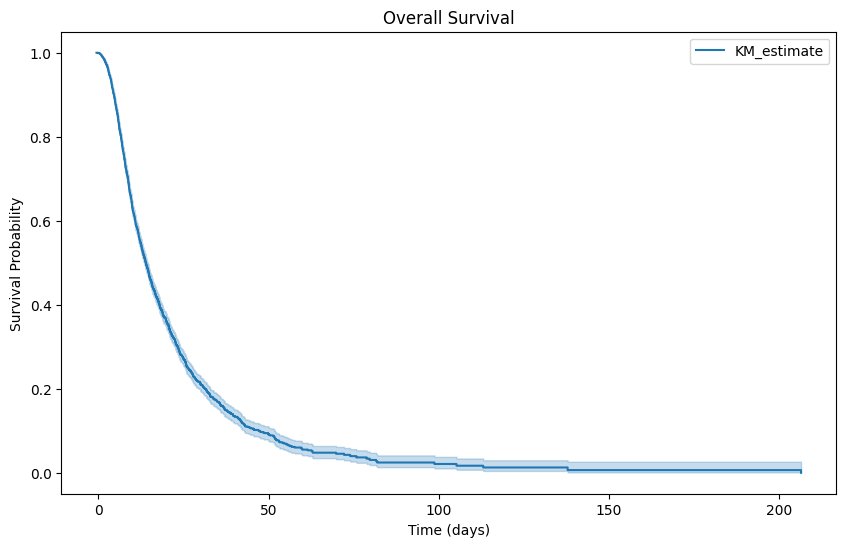

In [ ]:
plt.style.use('default')
plt.rcParams['axes.facecolor'] = 'white'

kmf = KaplanMeierFitter()
kmf.fit(durations=mortality_data['duration'], event_observed=mortality_data['event_observed'])

fig, ax = plt.subplots(figsize=(10, 6))
kmf.plot(ax=ax, ci_show=True)
ax.set_title('Overall Survival')
ax.set_xlabel('Time (days)')
ax.set_ylabel('Survival Probability')
plt.show()

In [ ]:
merged_df = pd.concat([mortality_data[['stay_id', 'dod', 'admittime', 'dischtime', 'event_observed', 'duration']], final_df.reset_index(drop=True)], axis=1)

# Log-rank test for metastatic_solid_tumor feature
group_1 = merged_df[merged_df['metastatic_solid_tumor'] == 0]
group_2 = merged_df[merged_df['metastatic_solid_tumor'] == 1]

# Log-rank test for severe_liver_disease feature
group_1_liver = merged_df[merged_df['severe_liver_disease'] == 0]
group_2_liver = merged_df[merged_df['severe_liver_disease'] == 1]

In [ ]:
# METASTATIC SOLID TUMOR
kmf_group_1 = KaplanMeierFitter()
kmf_group_1.fit(durations=group_1['duration'], event_observed=group_1['event_observed'], label='No Metastatic Solid Tumor')

kmf_group_2 = KaplanMeierFitter()
kmf_group_2.fit(durations=group_2['duration'], event_observed=group_2['event_observed'], label='Metastatic Solid Tumor')

results_metastatic = logrank_test(group_1['duration'], group_2['duration'], event_observed_A=group_1['event_observed'], event_observed_B=group_2['event_observed'])


# SEVERE LIVER DISEASE
kmf_group_1_liver = KaplanMeierFitter()
kmf_group_1_liver.fit(durations=group_1_liver['duration'], event_observed=group_1_liver['event_observed'], label='No Severe Liver Disease')

kmf_group_2_liver = KaplanMeierFitter()
kmf_group_2_liver.fit(durations=group_2_liver['duration'], event_observed=group_2_liver['event_observed'], label='Severe Liver Disease')

results_liver = logrank_test(group_1_liver['duration'], group_2_liver['duration'], event_observed_A=group_1_liver['event_observed'], event_observed_B=group_2_liver['event_observed'])

In [ ]:
import matplotlib.gridspec as gridspec

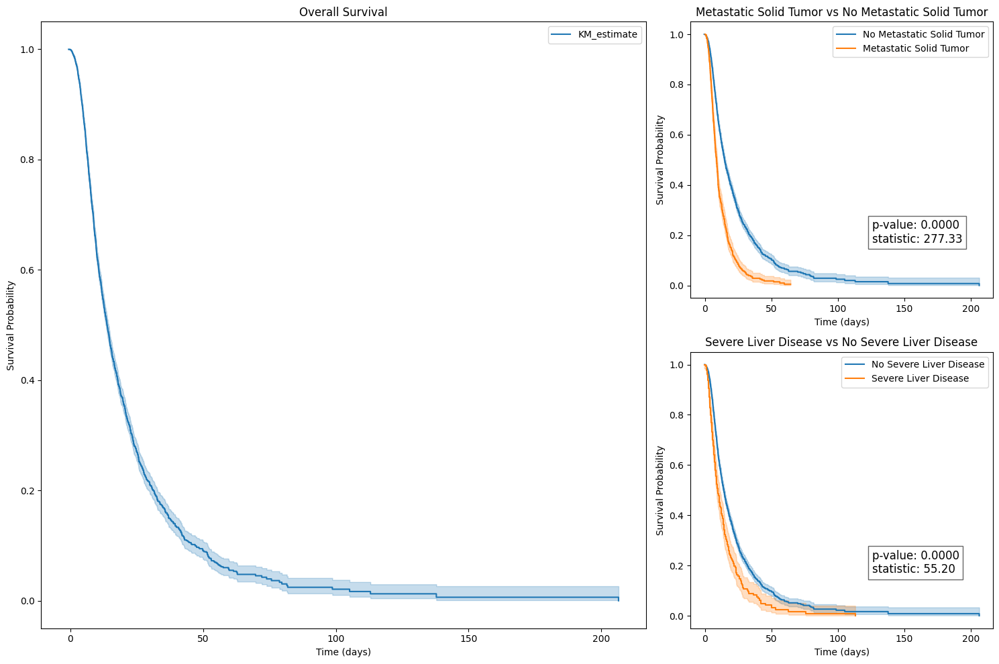

Metastatic Solid Tumor - Log-rank test p-value: 2.866895783853714e-62
Metastatic Solid Tumor - Log-rank test test statistic: 277.33015273104013
Severe Liver Disease - Log-rank test p-value: 1.0903487714178688e-13
Severe Liver Disease - Log-rank test test statistic: 55.19700276252448


In [ ]:
# Create a figure with the specified layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[2, 1])

# Plot 1: Overall survival plot on the left
ax1 = fig.add_subplot(gs[:, 0])
kmf.plot(ax=ax1, ci_show=True)
ax1.set_title('Overall Survival')
ax1.set_xlabel('Time (days)')
ax1.set_ylabel('Survival Probability')

# Plot 2: Survival comparison for metastatic solid tumor
ax2 = fig.add_subplot(gs[0, 1])
kmf_group_1.plot(ax=ax2, ci_show=True)
kmf_group_2.plot(ax=ax2, ci_show=True)
ax2.set_title('Metastatic Solid Tumor vs No Metastatic Solid Tumor')
ax2.set_xlabel('Time (days)')
ax2.set_ylabel('Survival Probability')
ax2.text(0.6, 0.2, f'p-value: {results_metastatic.p_value:.4f}\nstatistic: {results_metastatic.test_statistic:.2f}', transform=ax2.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.6))

# Plot 3: Survival comparison for severe liver disease
ax3 = fig.add_subplot(gs[1, 1])
kmf_group_1_liver.plot(ax=ax3, ci_show=True)
kmf_group_2_liver.plot(ax=ax3, ci_show=True)
ax3.set_title('Severe Liver Disease vs No Severe Liver Disease')
ax3.set_xlabel('Time (days)')
ax3.set_ylabel('Survival Probability')
ax3.text(0.6, 0.2, f'p-value: {results_liver.p_value:.4f}\nstatistic: {results_liver.test_statistic:.2f}', transform=ax3.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.6))

# Adjust layout
plt.tight_layout()
plt.show()

# Output the test statistics
print(f'Metastatic Solid Tumor - Log-rank test p-value: {results_metastatic.p_value}')
print(f'Metastatic Solid Tumor - Log-rank test test statistic: {results_metastatic.test_statistic}')
print(f'Severe Liver Disease - Log-rank test p-value: {results_liver.p_value}')
print(f'Severe Liver Disease - Log-rank test test statistic: {results_liver.test_statistic}')

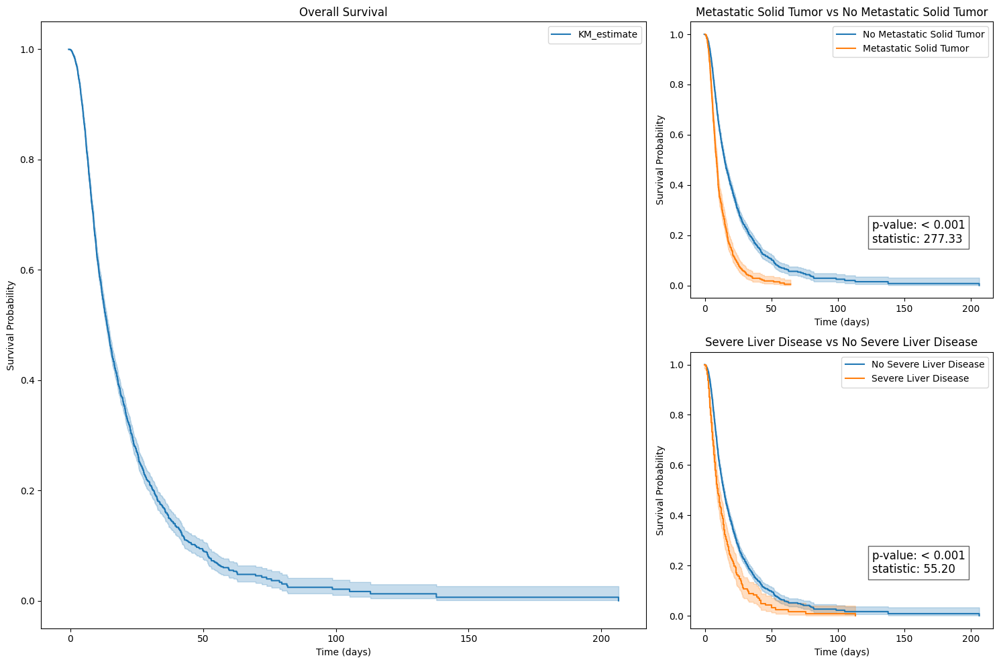

Metastatic Solid Tumor - Log-rank test p-value: < 0.001
Metastatic Solid Tumor - Log-rank test test statistic: 277.33015273104013
Severe Liver Disease - Log-rank test p-value: < 0.001
Severe Liver Disease - Log-rank test test statistic: 55.19700276252448


In [ ]:
# Create a figure with the specified layout
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[2, 1])

# Plot 1: Overall survival plot on the left
ax1 = fig.add_subplot(gs[:, 0])
kmf.plot(ax=ax1, ci_show=True)
ax1.set_title('Overall Survival')
ax1.set_xlabel('Time (days)')
ax1.set_ylabel('Survival Probability')

# Format the p-value display
def format_p_value(p):
    return f'< 0.001' if p < 0.001 else f'{p:.4f}'

# Plot 2: Survival comparison for metastatic solid tumor
ax2 = fig.add_subplot(gs[0, 1])
kmf_group_1.plot(ax=ax2, ci_show=True)
kmf_group_2.plot(ax=ax2, ci_show=True)
ax2.set_title('Metastatic Solid Tumor vs No Metastatic Solid Tumor')
ax2.set_xlabel('Time (days)')
ax2.set_ylabel('Survival Probability')
ax2.text(0.6, 0.2, f'p-value: {format_p_value(results_metastatic.p_value)}\nstatistic: {results_metastatic.test_statistic:.2f}', transform=ax2.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.6))

# Plot 3: Survival comparison for severe liver disease
ax3 = fig.add_subplot(gs[1, 1])
kmf_group_1_liver.plot(ax=ax3, ci_show=True)
kmf_group_2_liver.plot(ax=ax3, ci_show=True)
ax3.set_title('Severe Liver Disease vs No Severe Liver Disease')
ax3.set_xlabel('Time (days)')
ax3.set_ylabel('Survival Probability')
ax3.text(0.6, 0.2, f'p-value: {format_p_value(results_liver.p_value)}\nstatistic: {results_liver.test_statistic:.2f}', transform=ax3.transAxes, fontsize=12, bbox=dict(facecolor='white', alpha=0.6))

# Adjust layout
plt.tight_layout()
plt.show()

# Output the test statistics
print(f'Metastatic Solid Tumor - Log-rank test p-value: {format_p_value(results_metastatic.p_value)}')
print(f'Metastatic Solid Tumor - Log-rank test test statistic: {results_metastatic.test_statistic}')
print(f'Severe Liver Disease - Log-rank test p-value: {format_p_value(results_liver.p_value)}')
print(f'Severe Liver Disease - Log-rank test test statistic: {results_liver.test_statistic}')

#### COX MODELS

In [ ]:
from lifelines import CoxPHFitter

In [ ]:
df = pd.concat([mortality_data[['duration', 'event_observed']], final_df.reset_index(drop=True)], axis=1)

<lifelines.CoxPHFitter: fitted with 13068 total observations, 8749 right-censored observations>
             duration col = 'duration'
                event col = 'event_observed'
      baseline estimation = breslow
   number of observations = 13068
number of events observed = 4319
   partial log-likelihood = -32736.84
         time fit was run = 2024-06-26 08:08:19 UTC

---
                                       coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                                    
age_at_icu_intime                      0.45       1.57       0.04             0.37             0.54                 1.44                 1.71
gcs_min                               -0.00       1.00       0.01            -0.02             0.02                 0.98                 1.02
gcs_eyes                              -0.02       0.98       0.03            -0.07             0.03                 0.93                 1.03
gcs_verbal                             0.03       1.03       0.06            -0.09             0.15                 0.91                 1.16
gcs_motor                             -0.20       0.82       0.02            -0.23            -0.16                 0.79                 0.85
SOFA                                  -0.03       0.98       0.03            -0.08             0.03                 0.92                 1.03
vitals_heart_rate_min                  0.01       1.01       0.03            -0.05             0.07                 0.95                 1.07
vitals_heart_rate_max                  0.00       1.00       0.03            -0.06             0.06                 0.95                 1.06
vitals_sbp_min                         0.11       1.11       0.04             0.03             0.18                 1.03                 1.20
vitals_sbp_max                         0.03       1.03       0.04            -0.05             0.11                 0.95                 1.12
vitals_sbp_mean                       -0.07       0.93       0.05            -0.18             0.03                 0.84                 1.03
vitals_dbp_min                         0.06       1.06       0.04            -0.02             0.14                 0.98                 1.15
vitals_dbp_max                        -0.18       0.84       0.04            -0.26            -0.09                 0.77                 0.91
vitals_dbp_mean                        0.17       1.18       0.05             0.08             0.26                 1.08                 1.30
vitals_mbp_min                        -0.17       0.84       0.03            -0.24            -0.11                 0.79                 0.90
vitals_mbp_max                         0.11       1.12       0.04             0.03             0.20                 1.03                 1.22
vitals_resp_rate_min                   0.03       1.03       0.03            -0.02             0.08                 0.98                 1.09
vitals_resp_rate_max                  -0.05       0.95       0.03            -0.11             0.00                 0.89                 1.00
vitals_resp_rate_mean                  0.07       1.07       0.04            -0.00             0.14                 1.00                 1.15
vitals_temperature_min                -0.00       1.00       0.02            -0.04             0.04                 0.96                 1.04
vitals_temperature_max                -0.04       0.96       0.02            -0.08            -0.00                 0.92                 1.00
vitals_spo2_min                       -0.08       0.92       0.02            -0.12            -0.04                 0.88                 0.96
vitals_spo2_max                        0.02       1.02       0.03            -0.04             0.09                 0.96                 1.09
vitals_spo2_mean                       0.03       1.03       0.04       

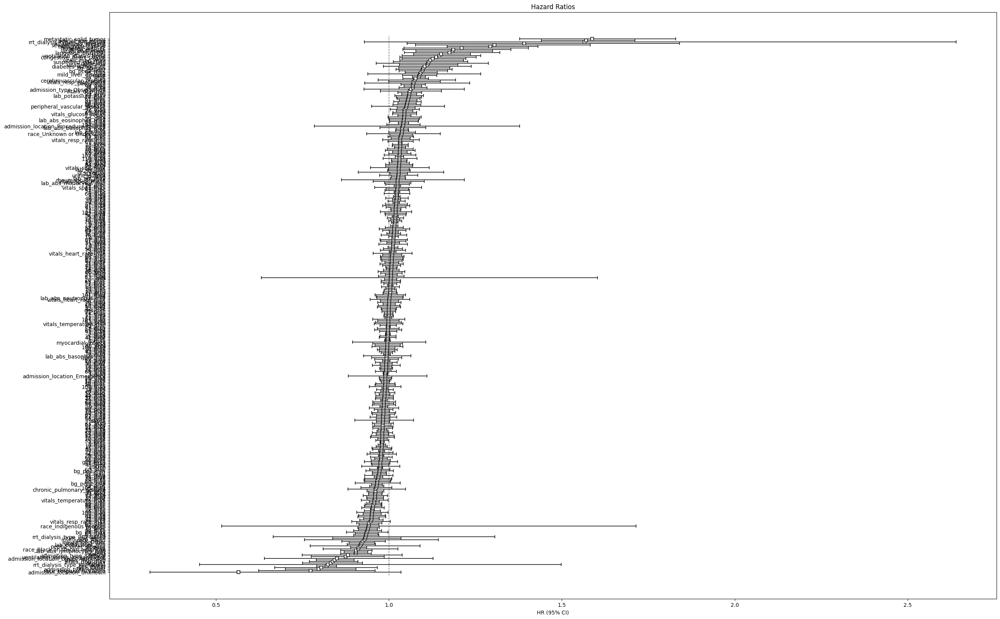

In [ ]:
# Fit the Cox Proportional Hazards model
cph = CoxPHFitter()
cph.fit(df, duration_col='duration', event_col='event_observed')

cph = CoxPHFitter()
cph.fit(df, duration_col='duration', event_col='event_observed')
cph.print_summary()

plt.figure(figsize=(30, 20))
cph.plot(hazard_ratios=True)
plt.title('Hazard Ratios')
plt.show()

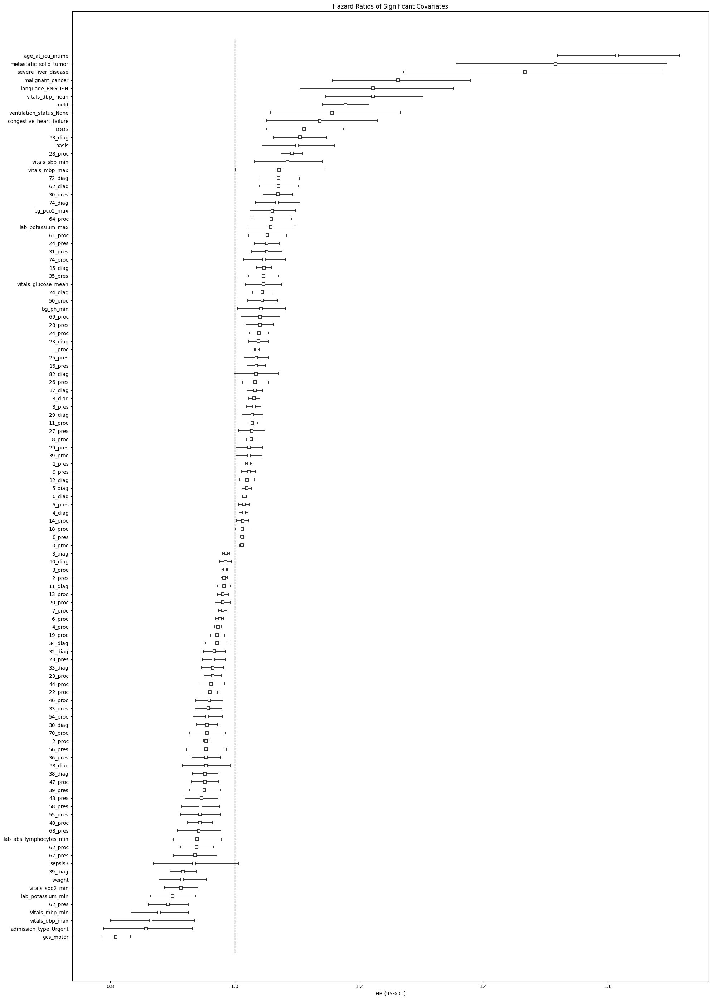

In [ ]:
summary = cph.summary
significant_covariates = summary[summary['p'] < 0.01]

significant_covariate_names = significant_covariates.index.tolist()

cph_significant = CoxPHFitter()
cph_significant.fit(df[['duration', 'event_observed'] + significant_covariate_names], duration_col='duration', event_col='event_observed')

plt.figure(figsize=(20, 28))
cph_significant.plot(hazard_ratios=True)
plt.title('Hazard Ratios of Significant Covariates')
plt.tight_layout()
#plt.subplots_adjust(top=0.95, bottom=0.05)

In [ ]:
cph_significant.print_summary()

<lifelines.CoxPHFitter: fitted with 13068 total observations, 8749 right-censored observations>
             duration col = 'duration'
                event col = 'event_observed'
      baseline estimation = breslow
   number of observations = 13068
number of events observed = 4319
   partial log-likelihood = -32870.91
         time fit was run = 2024-06-26 08:02:44 UTC

---
                                  coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                               
age_at_icu_intime                 0.44       1.55       0.03             0.37             0.50                 1.45                 1.66
gcs_motor                        -0.21       0.81       0.02            -0.24            -0.18                 0.78                 0.83
vitals_sbp_min                    0.07       1.07       0.03             0.02             0.12                 1.02                 1.13
vitals_dbp_max                   -0.14       0.87       0.04            -0.22            -0.06                 0.80                 0.94
vitals_dbp_mean                   0.20       1.22       0.03             0.13             0.26                 1.14                 1.30
vitals_mbp_min                   -0.13       0.88       0.03            -0.18            -0.07                 0.83                 0.93
vitals_mbp_max                    0.07       1.07       0.04            -0.00             0.14                 1.00                 1.15
vitals_temperature_max           -0.02       0.98       0.02            -0.05             0.02                 0.95                 1.02
vitals_spo2_min                  -0.09       0.92       0.02            -0.12            -0.06                 0.89                 0.94
vitals_glucose_mean               0.04       1.04       0.01             0.01             0.07                 1.01                 1.07
weight                           -0.10       0.90       0.02            -0.15            -0.06                 0.86                 0.94
lab_potassium_min                -0.11       0.90       0.02            -0.15            -0.07                 0.86                 0.94
lab_potassium_max                 0.05       1.05       0.02             0.01             0.09                 1.02                 1.09
lab_abs_eosinophils_max           0.04       1.04       0.02            -0.00             0.08                 1.00                 1.08
lab_abs_lymphocytes_min          -0.07       0.93       0.02            -0.12            -0.03                 0.89                 0.97
lab_ptt_max                       0.04       1.04       0.01             0.02             0.05                 1.02                 1.06
bg_ph_min                         0.08       1.08       0.02             0.03             0.12                 1.03                 1.13
bg_ph_max                        -0.05       0.95       0.02            -0.09            -0.01                 0.91                 0.99
bg_pco2_max                       0.06       1.07       0.02             0.03             0.10                 1.03                 1.10
oasis                             0.12       1.13       0.03             0.06             0.17                 1.06                 1.19
LODS                              0.12       1.12       0.03             0.06             0.17                 1.06                 1.19
meld                              0.12       1.13       0.02             0.09             0.16                 1.09                 1.17
0_diag                            0.01       1.01       0.00             0.01             0.02                 1.01                 1.02
1_diag                           -0.01       0.99       0.00            -0.02            -0.00                 0.99                 1.00
3_diag                           -0.01       0.99       0.00

In [ ]:
final_df = final_df[significant_covariate_names]
print(final_df.shape)

(13068, 147)


#### INFERENTIAL TESTS

In [ ]:
numerical_attributes_imputed.reset_index(drop=True, inplace=True)
mortality_data.reset_index(drop=True, inplace=True)

In [ ]:
mortality_data[['in_hospital_death']].shape

(13068, 1)

Class counts:
 in_hospital_death
0    8749
1    4319
Name: count, dtype: int64
Class distribution (%):
 in_hospital_death
0    66.949801
1    33.050199
Name: count, dtype: float64


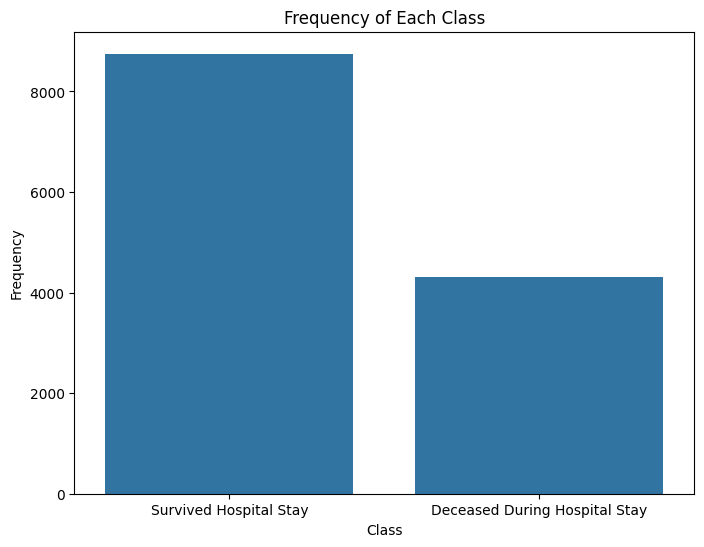

In [ ]:
# Checking the balance of the dataset
class_counts = mortality_data['in_hospital_death'].value_counts()
print("Class counts:\n", class_counts)

class_percentage = (class_counts / len(mortality_data)) * 100
print("Class distribution (%):\n", class_percentage)

# Plotting the class frequencies
plt.figure(figsize=(8, 6))
sns.barplot(x=class_counts.index, y=class_counts.values)
plt.title('Frequency of Each Class')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.xticks([0, 1], ['Survived Hospital Stay', 'Deceased During Hospital Stay'])
plt.show()

In [ ]:
import scipy.stats as stats

In [ ]:
def check_normality_and_apply_tests_with_prints(numerical_data, mortality_status, columns):
    results = {}
    for column in columns:

        survivors = numerical_data[mortality_status == 0][column]
        non_survivors = numerical_data[mortality_status == 1][column]

        p_value_survivors = stats.shapiro(survivors).pvalue
        p_value_non_survivors = stats.shapiro(non_survivors).pvalue

        mean_survivors = survivors.mean()
        std_survivors = survivors.std()
        mean_non_survivors = non_survivors.mean()
        std_non_survivors = non_survivors.std()

        # If both groups are normally distributed (p-value > 0.05), use t-test; otherwise, use Mann-Whitney U test.
        if p_value_survivors > 0.05 and p_value_non_survivors > 0.05:
            stat, p_value = stats.ttest_ind(survivors, non_survivors)
            test_used = 't-test'
        else:
            stat, p_value = stats.mannwhitneyu(survivors, non_survivors)
            test_used = 'Mann-Whitney U'

        results[column] = {
            'survivor_mean': mean_survivors,
            'survivor_std': std_survivors,
            'non_survivor_mean': mean_non_survivors,
            'non_survivor_std': std_non_survivors,
            'p_value': p_value,
            'test_used': test_used
        }

        print(f"Results for {column}:")
        print(f"  Survivor: Mean = {mean_survivors:.2f}, Std = {std_survivors:.2f}")
        print(f"  Non-Survivor: Mean = {mean_non_survivors:.2f}, Std = {std_non_survivors:.2f}")
        print(f"  P-value = {p_value:.4f}\n")

    return results

In [ ]:
numerical_attributes_imputed.columns

Index(['stay_id', 'age_at_icu_intime', 'gcs_min', 'gcs_eyes', 'gcs_verbal',
       'gcs_motor', 'SOFA', 'vitals_heart_rate_min', 'vitals_heart_rate_max',
       'vitals_sbp_min', 'vitals_sbp_max', 'vitals_sbp_mean', 'vitals_dbp_min',
       'vitals_dbp_max', 'vitals_dbp_mean', 'vitals_mbp_min', 'vitals_mbp_max',
       'vitals_resp_rate_min', 'vitals_resp_rate_max', 'vitals_resp_rate_mean',
       'vitals_temperature_min', 'vitals_temperature_max', 'vitals_spo2_min',
       'vitals_spo2_max', 'vitals_spo2_mean', 'vitals_glucose_mean', 'weight',
       'urine_output', 'lab_potassium_min', 'lab_potassium_max',
       'lab_abs_basophils_min', 'lab_abs_basophils_max',
       'lab_abs_eosinophils_max', 'lab_abs_lymphocytes_min',
       'lab_abs_monocytes_min', 'lab_abs_neutrophils_min', 'lab_inr_min',
       'lab_ptt_min', 'lab_ptt_max', 'bg_ph_min', 'bg_ph_max', 'bg_po2_min',
       'bg_pco2_min', 'bg_pco2_max', 'oasis', 'sapsii', 'sirs', 'LODS',
       'meld'],
      dtype='object')

In [ ]:
columns_to_test = ['stay_id', 'age_at_icu_intime', 'gcs_min', 'gcs_eyes', 'gcs_verbal',
       'gcs_motor', 'SOFA', 'vitals_heart_rate_min', 'vitals_heart_rate_max',
       'vitals_sbp_min', 'vitals_sbp_max', 'vitals_sbp_mean', 'vitals_dbp_min',
       'vitals_dbp_max', 'vitals_dbp_mean', 'vitals_mbp_min', 'vitals_mbp_max',
       'vitals_resp_rate_min', 'vitals_resp_rate_max', 'vitals_resp_rate_mean',
       'vitals_temperature_min', 'vitals_temperature_max', 'vitals_spo2_min',
       'vitals_spo2_max', 'vitals_spo2_mean', 'vitals_glucose_mean', 'weight',
       'urine_output', 'lab_potassium_min', 'lab_potassium_max',
       'lab_abs_basophils_min', 'lab_abs_basophils_max',
       'lab_abs_eosinophils_max', 'lab_abs_lymphocytes_min',
       'lab_abs_monocytes_min', 'lab_abs_neutrophils_min', 'lab_inr_min',
       'lab_ptt_min', 'lab_ptt_max', 'bg_ph_min', 'bg_ph_max', 'bg_po2_min',
       'bg_pco2_min', 'bg_pco2_max', 'oasis', 'sapsii', 'sirs', 'LODS',
       'meld']
results = check_normality_and_apply_tests_with_prints(numerical_attributes_imputed, mortality_data['in_hospital_death'], columns_to_test)

Results for stay_id:
  Survivor: Mean = 34960008.13, Std = 2892968.92
  Non-Survivor: Mean = 34967755.33, Std = 2935687.05
  P-value = 0.8920

Results for age_at_icu_intime:
  Survivor: Mean = 61.10, Std = 16.89
  Non-Survivor: Mean = 72.13, Std = 14.03
  P-value = 0.0000

Results for gcs_min:
  Survivor: Mean = 14.41, Std = 1.08
  Non-Survivor: Mean = 13.72, Std = 2.26
  P-value = 0.0000

Results for gcs_eyes:
  Survivor: Mean = 3.35, Std = 0.69
  Non-Survivor: Mean = 3.09, Std = 0.99
  P-value = 0.0000

Results for gcs_verbal:
  Survivor: Mean = 3.20, Std = 2.26
  Non-Survivor: Mean = 2.91, Std = 2.18
  P-value = 0.0000

Results for gcs_motor:
  Survivor: Mean = 5.82, Std = 0.47
  Non-Survivor: Mean = 5.34, Std = 1.24
  P-value = 0.0000

Results for SOFA:
  Survivor: Mean = 3.28, Std = 2.23
  Non-Survivor: Mean = 4.56, Std = 2.92
  P-value = 0.0000

Results for vitals_heart_rate_min:
  Survivor: Mean = 67.74, Std = 13.05
  Non-Survivor: Mean = 69.83, Std = 14.95
  P-value = 0.0000

R

In [ ]:
from scipy.stats import chi2_contingency, fisher_exact

In [ ]:
# DUMMY ATTRIBUTES
def analyze_categorical_data(categorical_data, mortality_status):
    results = {}
    for column in categorical_data.columns:

        table = pd.crosstab(categorical_data[column], mortality_status)

        if (table.values < 5).sum() > 0:
            if table.shape[0] == 2 and table.shape[1] == 2:
                odds_ratio, p_value = fisher_exact(table)
                test_used = 'Fisher’s Exact Test'
            else:
                chi2, p_value, _, _ = chi2_contingency(table)
                test_used = 'Chi-square Test'
        else:
            chi2, p_value, _, _ = chi2_contingency(table)
            test_used = 'Chi-square Test'

        table_percentage = table.div(table.sum(axis=0), axis=1) * 100

        print(f"Results for {column}:")
        print("Contingency Table (Counts):")
        print(table)
        print("\nContingency Table (Percentages):")
        print(table_percentage)
        print(f"P-value = {p_value:.4f} ({test_used})\n")

        results[column] = {'table_counts': table, 'table_percentages': table_percentage, 'p_value': p_value, 'test_used': test_used}

    return results

In [ ]:
categorical_results = analyze_categorical_data(dummy_attributes, mortality_data['in_hospital_death'])

Results for gender:
Contingency Table (Counts):
in_hospital_death     0     1
gender                       
0                  2569  1206
1                  3570  1851

Contingency Table (Percentages):
in_hospital_death          0          1
gender                                 
0                  41.847206  39.450442
1                  58.152794  60.549558
P-value = 0.0294 (Chi-square Test)

Results for rrt_dialysis_present:
Contingency Table (Counts):
in_hospital_death        0     1
rrt_dialysis_present            
0.0                   5929  2934
1.0                    210   123

Contingency Table (Percentages):
in_hospital_death             0          1
rrt_dialysis_present                      
0.0                   96.579247  95.976447
1.0                    3.420753   4.023553
P-value = 0.1620 (Chi-square Test)

Results for suspected_infection:
Contingency Table (Counts):
in_hospital_death       0     1
suspected_infection            
0.0                  2523  1227
1.0      

## SEPARATING TRAINING AND SET

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
# Splitting the data into train and test sets with stratification
X_train, X_test, y_train, y_test = train_test_split(
    final_df,
    mortality_data['in_hospital_death'],
    test_size=0.2,
    random_state=42,
    stratify=mortality_data['in_hospital_death'])

In [ ]:
# Check the distribution of classes post-split to ensure stratification worked
train_class_distribution = y_train.value_counts(normalize=True)
test_class_distribution = y_test.value_counts(normalize=True)

train_class_distribution, test_class_distribution

(in_hospital_death
 0    0.669504
 1    0.330496
 Name: proportion, dtype: float64,
 in_hospital_death
 0    0.669472
 1    0.330528
 Name: proportion, dtype: float64)

In [ ]:
# Convert feature names in X_train and X_test to strings
X_train.columns = X_train.columns.astype(str)
X_test.columns = X_test.columns.astype(str)

#### UMAP CLUSTERING

In [ ]:
!pip install umap-learn

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 85.7/85.7 kB 4.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.9/56.9 kB 7.2 MB/s eta 0:00:00


In [ ]:
from sklearn.cluster import KMeans
from umap import UMAP
from scipy.spatial import ConvexHull

In [ ]:
# Apply UMAP for dimensionality reduction
umap = UMAP(n_components=2, random_state=42)
X_train_umap = umap.fit_transform(X_train)
X_test_umap = umap.transform(X_test)

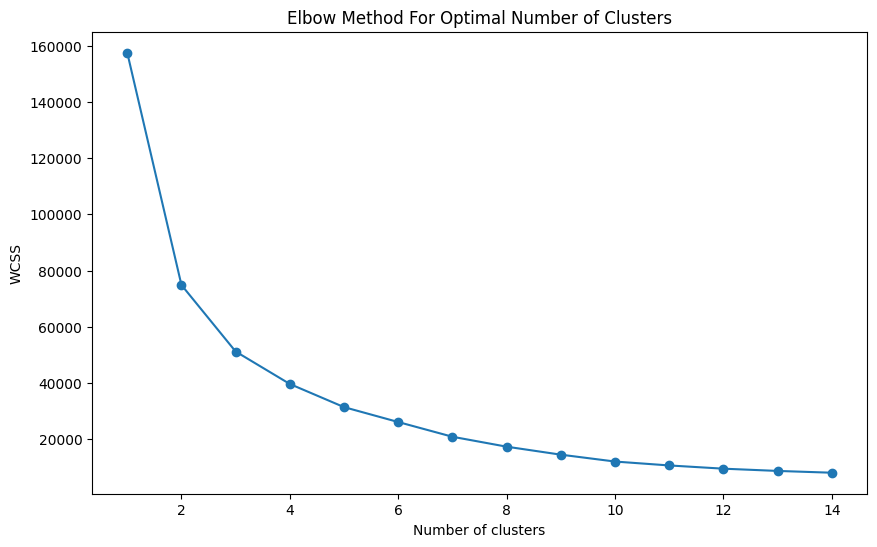

In [ ]:
# Determine the optimal number of clusters using the elbow method
wcss = []
for i in range(1, 15):
    kmeans = KMeans(n_clusters=i, random_state=42)
    kmeans.fit(X_train_umap)
    wcss.append(kmeans.inertia_)

# Plot the elbow graph
plt.figure(figsize=(10, 6))
plt.plot(range(1, 15), wcss, marker='o')
plt.title('Elbow Method For Optimal Number of Clusters')
plt.xlabel('Number of clusters')
plt.ylabel('WCSS')
plt.show()

In [ ]:
# Apply KMeans clustering with the optimal number of clusters
optimal_clusters = 3
kmeans = KMeans(n_clusters=optimal_clusters, random_state=42)
train_clusters = kmeans.fit_predict(X_train_umap)
test_clusters = kmeans.predict(X_test_umap)

# UMAP results and clusters
umap_test_df = pd.DataFrame(X_test_umap, columns=['UMAP1', 'UMAP2'])
umap_test_df['Cluster'] = test_clusters
umap_test_df['Survival'] = y_test.values
umap_test_df['MetastaticSolidTumor'] = X_test['metastatic_solid_tumor'].values
umap_test_df['SevereLiverDisease'] = X_test['severe_liver_disease'].values

In [ ]:
def plot_convex_hulls(df, ax):
    for cluster in df['Cluster'].unique():
        cluster_points = df[df['Cluster'] == cluster][['UMAP1', 'UMAP2']].values
        hull = ConvexHull(cluster_points)
        for simplex in hull.simplices:
            ax.plot(cluster_points[simplex, 0], cluster_points[simplex, 1], 'k--', lw=2)
        centroid = cluster_points.mean(axis=0)
        ax.text(centroid[0], centroid[1], f'Cluster {cluster + 1}', fontsize=12, ha='center', va='center',
                bbox=dict(facecolor='white', alpha=0.6, edgecolor='black'))

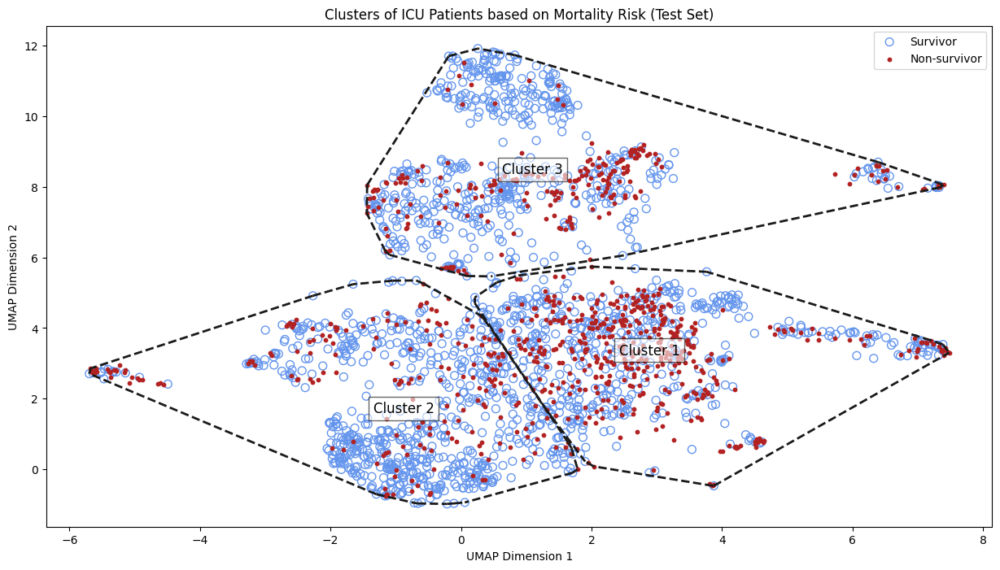

In [ ]:
# Set plot style
plt.style.use('default')
plt.rcParams['axes.facecolor'] = 'white'

# SURVIVOR and NOT SURVIVOR
plt.figure(figsize=(15, 8))
ax = plt.gca()
plot_convex_hulls(umap_test_df, ax)
for survival_status in [0, 1]:
    subset = umap_test_df[umap_test_df['Survival'] == survival_status]
    if survival_status == 0:
        plt.scatter(subset['UMAP1'], subset['UMAP2'], edgecolors='cornflowerblue', facecolors='none', s=50, label='Survivor')
    else:
        plt.scatter(subset['UMAP1'], subset['UMAP2'], color='firebrick', s=10, label='Non-survivor')

plt.title('Clusters of ICU Patients based on Mortality Risk (Test Set)')
plt.xlabel('UMAP Dimension 1')
plt.ylabel('UMAP Dimension 2')
plt.legend()
plt.grid(False)
plt.show()

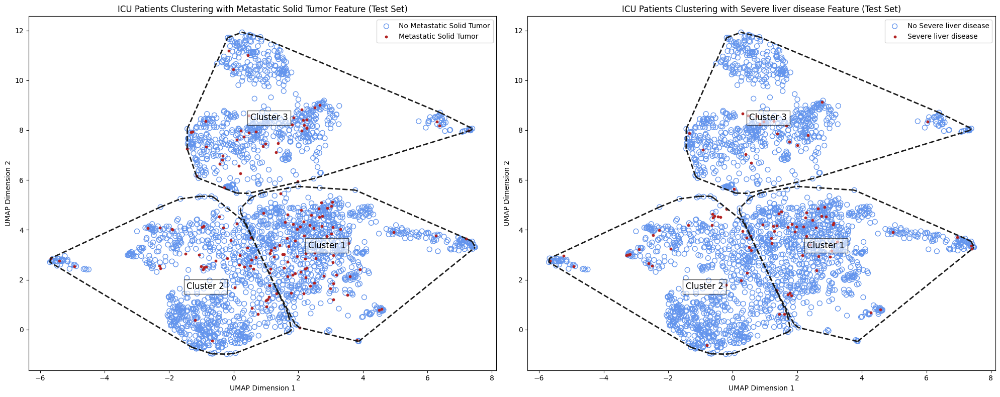

In [ ]:
fig, axes = plt.subplots(1, 2, figsize=(20, 8))

# METASTATIC_SOLID_TUMOR
ax = axes[0]
plot_convex_hulls(umap_test_df, ax)
for tumor_status in [0, 1]:
    subset = umap_test_df[umap_test_df['MetastaticSolidTumor'] == tumor_status]
    if tumor_status == 0:
        ax.scatter(subset['UMAP1'], subset['UMAP2'], edgecolors='cornflowerblue', facecolors='none', s=50, label='No Metastatic Solid Tumor')
    else:
        ax.scatter(subset['UMAP1'], subset['UMAP2'], color='firebrick', s=10, label='Metastatic Solid Tumor')

ax.set_title('ICU Patients Clustering with Metastatic Solid Tumor Feature (Test Set)')
ax.set_xlabel('UMAP Dimension 1')
ax.set_ylabel('UMAP Dimension 2')
ax.legend()
ax.grid(False)

# SEVERE LIVER DISEASE
ax = axes[1]
plot_convex_hulls(umap_test_df, ax)
for liver_status in [0, 1]:
    subset = umap_test_df[umap_test_df['SevereLiverDisease'] == liver_status]
    if liver_status == 0:
        ax.scatter(subset['UMAP1'], subset['UMAP2'], edgecolors='cornflowerblue', facecolors='none', s=50, label='No Severe liver disease')
    else:
        ax.scatter(subset['UMAP1'], subset['UMAP2'], color='firebrick', s=10, label='Severe liver disease')

ax.set_title('ICU Patients Clustering with Severe liver disease Feature (Test Set)')
ax.set_xlabel('UMAP Dimension 1')
ax.set_ylabel('UMAP Dimension 2')
ax.legend()
ax.grid(False)

# Show the plot
plt.tight_layout()
plt.show()

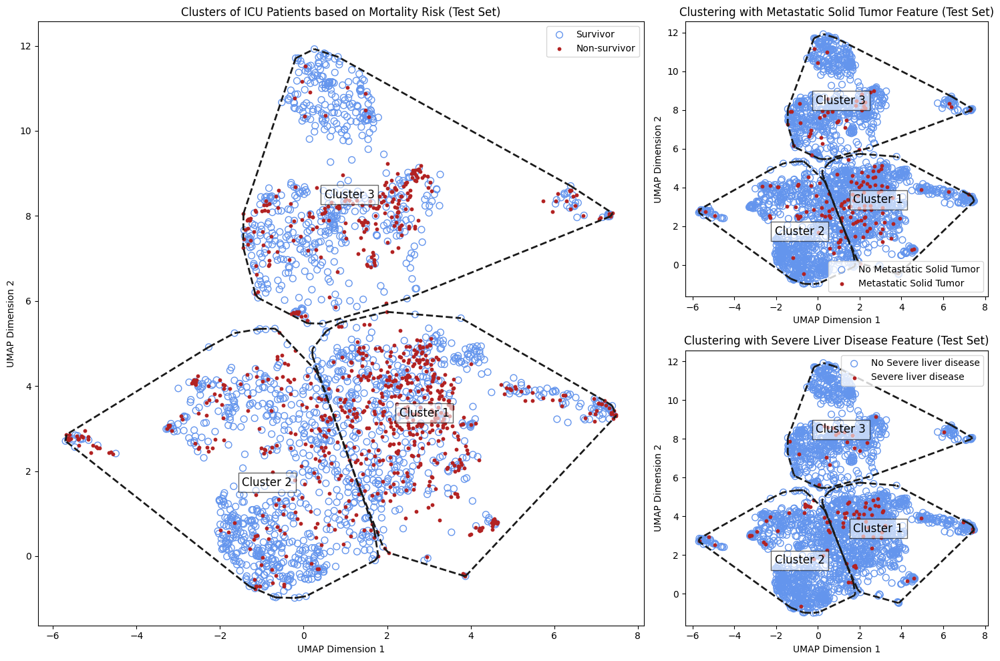

In [ ]:
fig = plt.figure(figsize=(15, 10))
gs = gridspec.GridSpec(2, 2, width_ratios=[2, 1])

# Plot 1: Overall cluster
ax1 = fig.add_subplot(gs[:, 0])
plot_convex_hulls(umap_test_df, ax=ax1)
for survival_status in [0, 1]:
    subset = umap_test_df[umap_test_df['Survival'] == survival_status]
    if survival_status == 0:
        ax1.scatter(subset['UMAP1'], subset['UMAP2'], edgecolors='cornflowerblue', facecolors='none', s=50, label='Survivor')
    else:
        ax1.scatter(subset['UMAP1'], subset['UMAP2'], color='firebrick', s=10, label='Non-survivor')

ax1.set_title('Clusters of ICU Patients based on Mortality Risk (Test Set)')
ax1.set_xlabel('UMAP Dimension 1')
ax1.set_ylabel('UMAP Dimension 2')
ax1.legend()
ax1.grid(False)

# Plot 2: METASTATIC_SOLID_TUMOR
ax2 = fig.add_subplot(gs[0, 1])
plot_convex_hulls(umap_test_df, ax=ax2)
for tumor_status in [0, 1]:
    subset = umap_test_df[umap_test_df['MetastaticSolidTumor'] == tumor_status]
    if tumor_status == 0:
        ax2.scatter(subset['UMAP1'], subset['UMAP2'], edgecolors='cornflowerblue', facecolors='none', s=50, label='No Metastatic Solid Tumor')
    else:
        ax2.scatter(subset['UMAP1'], subset['UMAP2'], color='firebrick', s=10, label='Metastatic Solid Tumor')

ax2.set_title('Clustering with Metastatic Solid Tumor Feature (Test Set)')
ax2.set_xlabel('UMAP Dimension 1')
ax2.set_ylabel('UMAP Dimension 2')
ax2.legend()
ax2.grid(False)

# Plot 3: SEVERE LIVER DISEASE
ax3 = fig.add_subplot(gs[1, 1])
plot_convex_hulls(umap_test_df, ax=ax3)
for liver_status in [0, 1]:
    subset = umap_test_df[umap_test_df['SevereLiverDisease'] == liver_status]
    if liver_status == 0:
        ax3.scatter(subset['UMAP1'], subset['UMAP2'], edgecolors='cornflowerblue', facecolors='none', s=50, label='No Severe liver disease')
    else:
        ax3.scatter(subset['UMAP1'], subset['UMAP2'], color='firebrick', s=10, label='Severe liver disease')

ax3.set_title('Clustering with Severe Liver Disease Feature (Test Set)')
ax3.set_xlabel('UMAP Dimension 1')
ax3.set_ylabel('UMAP Dimension 2')
ax3.legend()
ax3.grid(False)

# Adjust layout
plt.tight_layout()
plt.show()

## CLASSIFICATION MODELS



In [ ]:
pip install mlxtend

In [ ]:
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import f1_score, precision_score, confusion_matrix, classification_report, roc_curve, roc_auc_score, precision_recall_curve
from sklearn import metrics

In [ ]:
def hyperp_search(classifier, parameters):
    gs = GridSearchCV(classifier, parameters, cv=3, scoring='f1', verbose=1, n_jobs=-1)
    gs = gs.fit(X_train, y_train)
    print("")
    print("f1_train: %f using %s" % (gs.best_score_, gs.best_params_))

    best_model = gs.best_estimator_
    y_pred = best_model.predict(X_test)
    y_pred_train = best_model.predict(X_train)

    print("")
    print("f1         train %.3f   test %.3f" % (f1_score(y_train, y_pred_train), f1_score(y_test, y_pred)))
    print("precision  train %.3f   test %.3f" % (precision_score(y_train, y_pred_train), precision_score(y_test, y_pred)))
    print("")
    print(confusion_matrix(y_test, y_pred))
    print(classification_report(y_test, y_pred))

def roc(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_probs = model.predict_proba(X_test)

    fpr, tpr, _ = roc_curve(y_test, y_probs[:, 1])
    auc = roc_auc_score(y_test, y_probs[:, 1])

    plt.plot(fpr, tpr, label=f'{model.__class__.__name__} (AUC: {auc:.2f})')

    return fpr, tpr, auc

def confusion_matrix_plot(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)

    cm = confusion_matrix(y_test, y_pred)

    plt.figure(figsize=(6, 5))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title('Confusion Matrix')
    plt.show()

Fitting 3 folds for each of 180 candidates, totalling 540 fits

f1_train: 0.572363 using {'leaf_size': 1, 'n_neighbors': 32, 'p': 1}

f1         train 0.625   test 0.592
precision  train 0.738   test 0.711

[[1572  178]
 [ 426  438]]
              precision    recall  f1-score   support

           0       0.79      0.90      0.84      1750
           1       0.71      0.51      0.59       864

    accuracy                           0.77      2614
   macro avg       0.75      0.70      0.72      2614
weighted avg       0.76      0.77      0.76      2614



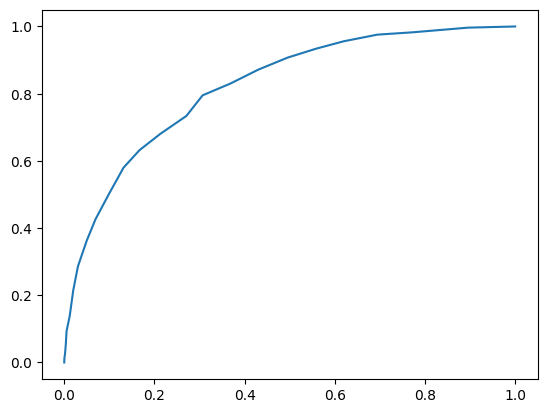

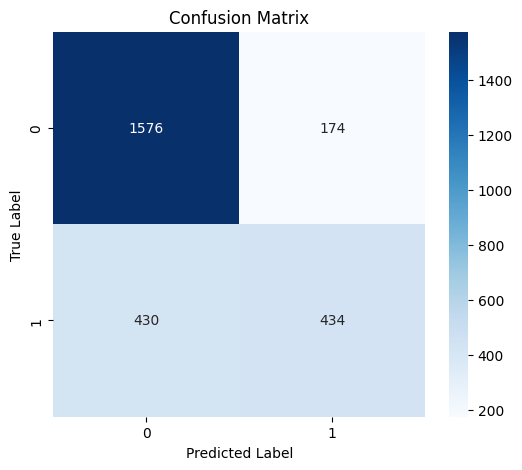

In [ ]:
### KNN

from sklearn.neighbors import KNeighborsClassifier

classifier = KNeighborsClassifier()
parameters = {'n_neighbors': np.arange(10, 100, 2), 'p': [1, 2], 'leaf_size': [1, 2]}

hyperp_search(classifier, parameters)

model_knn = KNeighborsClassifier(n_neighbors=26, p=1, leaf_size=1)

fpr1, tpr1, auc1 = roc(model_knn, X_train, y_train, X_test, y_test)

confusion_matrix_plot(model_knn, X_train, y_train, X_test, y_test)

Fitting 3 folds for each of 4 candidates, totalling 12 fits

f1_train: 0.635792 using {'criterion': 'gini', 'min_samples_leaf': 33, 'splitter': 'best'}

f1         train 0.741   test 0.640
precision  train 0.801   test 0.701

[[1533  217]
 [ 355  509]]
              precision    recall  f1-score   support

           0       0.81      0.88      0.84      1750
           1       0.70      0.59      0.64       864

    accuracy                           0.78      2614
   macro avg       0.76      0.73      0.74      2614
weighted avg       0.78      0.78      0.78      2614



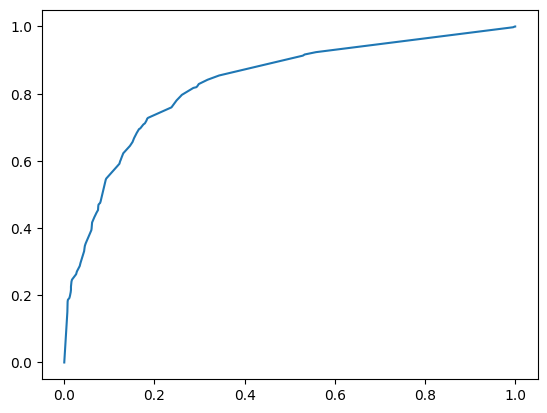

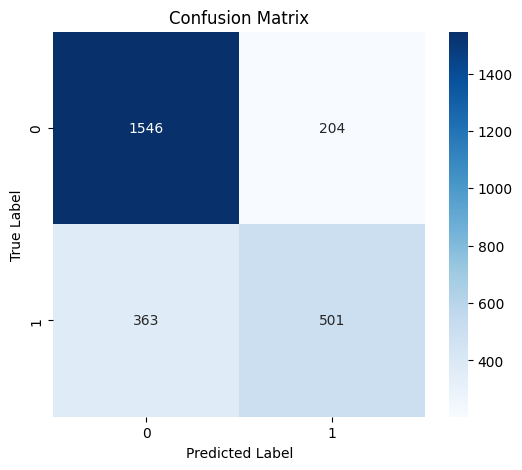

In [ ]:
### Classification Tree

from sklearn.tree import DecisionTreeClassifier
classifier = DecisionTreeClassifier()
parameters = {'criterion': ['entropy', 'gini'], 'splitter': ['best', 'random'], 'min_samples_leaf': [33]}

hyperp_search(classifier, parameters)

model_tree = DecisionTreeClassifier(criterion='gini', max_depth=8, min_samples_leaf=26, min_samples_split=22)

fpr2, tpr2, auc2 = roc(model_tree, X_train, y_train, X_test, y_test)

confusion_matrix_plot(model_tree, X_train, y_train, X_test, y_test)

Fitting 3 folds for each of 1 candidates, totalling 3 fits

f1_train: 0.701061 using {}

f1         train 0.705   test 0.685
precision  train 0.679   test 0.674

[[1459  291]
 [ 262  602]]
              precision    recall  f1-score   support

           0       0.85      0.83      0.84      1750
           1       0.67      0.70      0.69       864

    accuracy                           0.79      2614
   macro avg       0.76      0.77      0.76      2614
weighted avg       0.79      0.79      0.79      2614



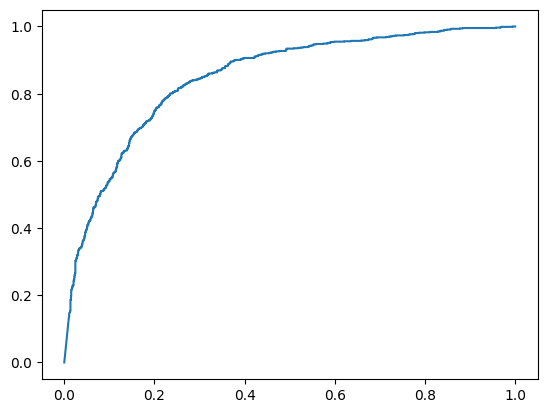

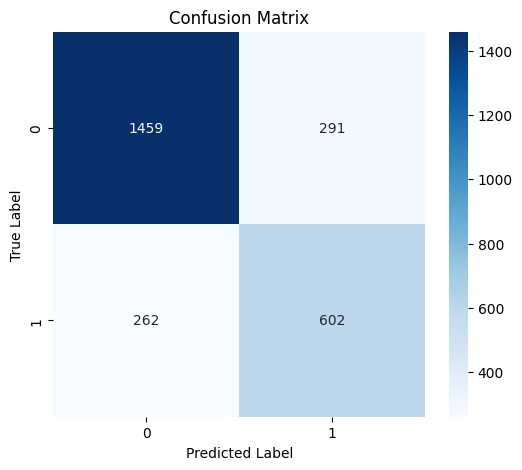

In [ ]:
### Naive Bayes Classifiers

from sklearn.naive_bayes import GaussianNB

classifier = GaussianNB()
parameters = {}

hyperp_search(classifier, parameters)

model_NBC = GaussianNB()

fpr3, tpr3, auc3 = roc(model_NBC, X_train, y_train, X_test, y_test)

confusion_matrix_plot(model_NBC, X_train, y_train, X_test, y_test)

Fitting 3 folds for each of 980 candidates, totalling 2940 fits

f1_train: 0.734456 using {'C': 0.7, 'class_weight': 'balanced', 'max_iter': 90, 'solver': 'lbfgs'}

f1         train 0.748   test 0.736
precision  train 0.694   test 0.690

[[1444  306]
 [ 183  681]]
              precision    recall  f1-score   support

           0       0.89      0.83      0.86      1750
           1       0.69      0.79      0.74       864

    accuracy                           0.81      2614
   macro avg       0.79      0.81      0.80      2614
weighted avg       0.82      0.81      0.82      2614



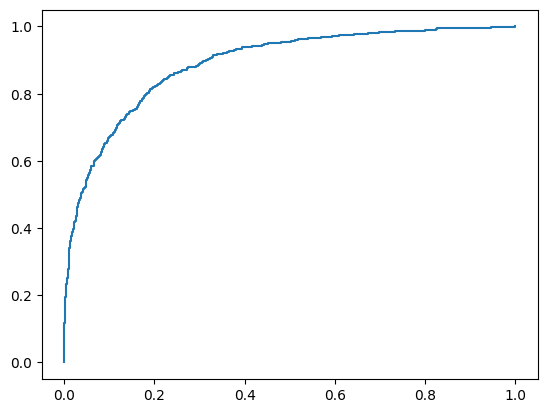

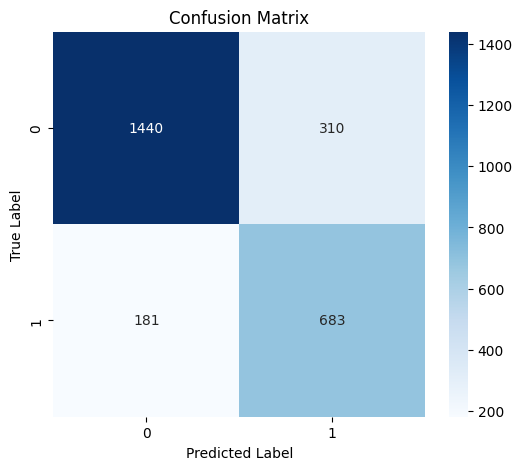

In [ ]:
### Logistic Regression

from sklearn.linear_model import LogisticRegression

classifier = LogisticRegression(random_state=123)
parameters = {'solver': ['newton-cg', 'lbfgs'], 'class_weight': ['balanced', None], "C": [1e-2, 0.05, 1e-1, 0.2, 0.5, 0.7, 1], "max_iter": np.arange(50, 400, 10)}

hyperp_search(classifier, parameters)

chosen_model = LogisticRegression(C=0.1, solver='newton-cg', max_iter=50, class_weight='balanced')

fpr4, tpr4, auc4 = roc(chosen_model, X_train, y_train, X_test, y_test)

confusion_matrix_plot(chosen_model, X_train, y_train, X_test, y_test)

Fitting 3 folds for each of 97 candidates, totalling 291 fits

f1_train: 0.715060 using {'C': 0.6300000000000001, 'kernel': 'linear'}

f1         train 0.732   test 0.711
precision  train 0.783   test 0.775

[[1585  165]
 [ 297  567]]
              precision    recall  f1-score   support

           0       0.84      0.91      0.87      1750
           1       0.77      0.66      0.71       864

    accuracy                           0.82      2614
   macro avg       0.81      0.78      0.79      2614
weighted avg       0.82      0.82      0.82      2614



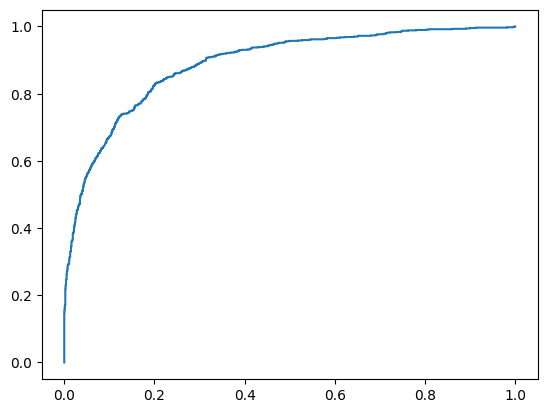

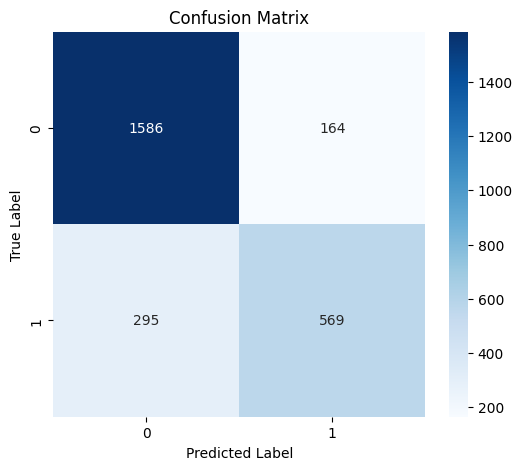

In [ ]:
### Support Vector Machines

from sklearn.svm import SVC

classifier = SVC(random_state=123, probability=True)
parameters = {'kernel': ['linear'], 'C': np.arange(0.03, 1, 0.01)}

hyperp_search(classifier, parameters)

model = SVC(C=0.08, kernel='linear', probability=True)

fpr5, tpr5, auc5 = roc(model, X_train, y_train, X_test, y_test)

confusion_matrix_plot(model, X_train, y_train, X_test, y_test)

Fitting 3 folds for each of 72 candidates, totalling 216 fits

f1_train: 0.701723 using {'alpha': 4.75, 'hidden_layer_sizes': 42, 'max_iter': 2000}

f1         train 0.784   test 0.705
precision  train 0.834   test 0.767

[[1579  171]
 [ 301  563]]
              precision    recall  f1-score   support

           0       0.84      0.90      0.87      1750
           1       0.77      0.65      0.70       864

    accuracy                           0.82      2614
   macro avg       0.80      0.78      0.79      2614
weighted avg       0.82      0.82      0.82      2614



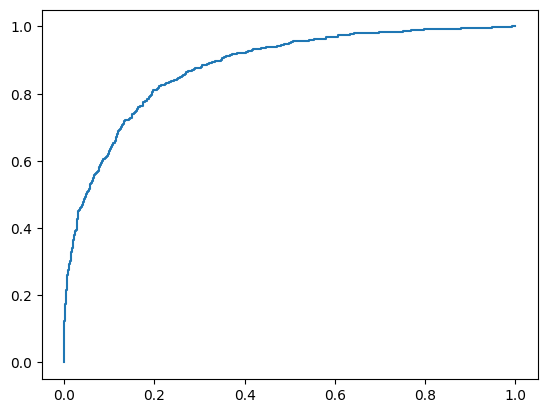

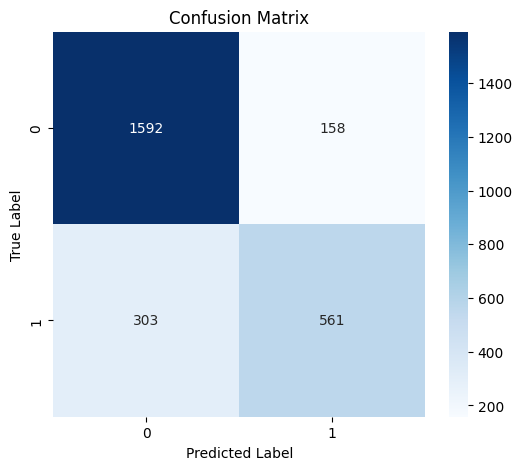

In [ ]:
### Multi-layer Perceptron classifier (Neural Networks)

from sklearn.neural_network import MLPClassifier

classifier = MLPClassifier(random_state=123)
parameters = {"hidden_layer_sizes": [30, 35, 38, 40, 42, 45], "max_iter": [2000], "alpha": np.arange(2, 5, 0.25)}

hyperp_search(classifier, parameters)

model_MLP = MLPClassifier(hidden_layer_sizes=40, alpha=2, max_iter=2000)

fpr6, tpr6, auc6 = roc(model_MLP, X_train, y_train, X_test, y_test)

confusion_matrix_plot(model_MLP, X_train, y_train, X_test, y_test)

Fitting 3 folds for each of 7 candidates, totalling 21 fits

f1_train: 0.634923 using {'min_samples_leaf': 33, 'n_estimators': 800}

f1         train 0.757   test 0.640
precision  train 0.891   test 0.808

[[1641  109]
 [ 406  458]]
              precision    recall  f1-score   support

           0       0.80      0.94      0.86      1750
           1       0.81      0.53      0.64       864

    accuracy                           0.80      2614
   macro avg       0.80      0.73      0.75      2614
weighted avg       0.80      0.80      0.79      2614



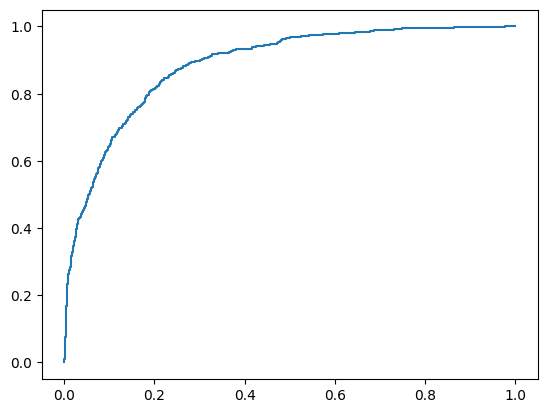

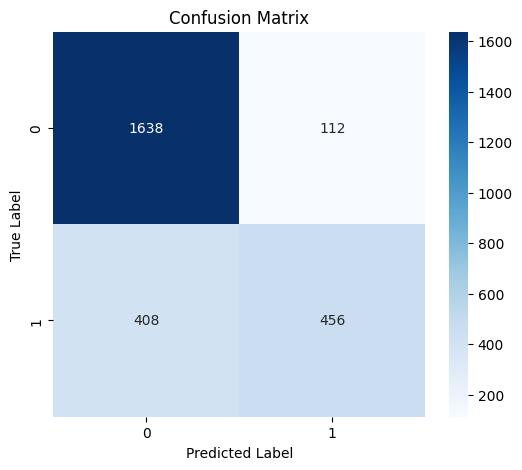

In [ ]:
### Random Forest

from sklearn.ensemble import RandomForestClassifier

classifier = RandomForestClassifier(random_state=123)
parameters = {'n_estimators': np.arange(50, 1000, 150), 'min_samples_leaf': [33]}

hyperp_search(classifier, parameters)

model_RFC = RandomForestClassifier(criterion='entropy', min_samples_leaf=33, n_estimators=650)

fpr7, tpr7, auc7 = roc(model_RFC, X_train, y_train, X_test, y_test)

confusion_matrix_plot(model_RFC, X_train, y_train, X_test, y_test)

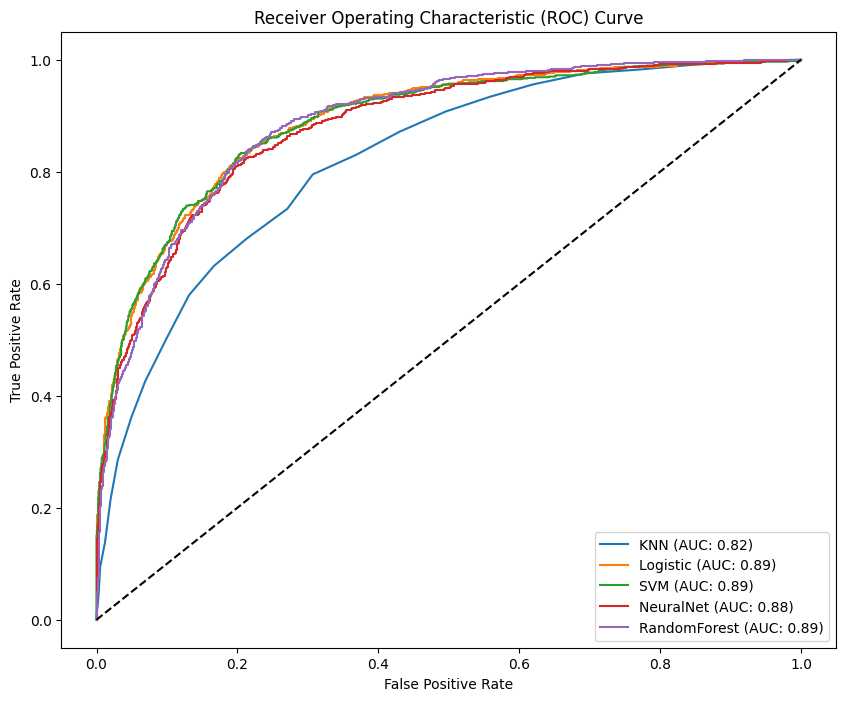

In [ ]:
### ROC curves of all the previous algorithms

plt.figure(figsize=(10, 8))
plt.plot(fpr1, tpr1, label=f"KNN (AUC: {auc1:.2f})")
# plt.plot(fpr2, tpr2, label=f"Tree (AUC: {auc2:.2f})")
# plt.plot(fpr3, tpr3, label=f"NB (AUC: {auc3:.2f})")
plt.plot(fpr4, tpr4, label=f"Logistic (AUC: {auc4:.2f})")
plt.plot(fpr5, tpr5, label=f"SVM (AUC: {auc5:.2f})")
plt.plot(fpr6, tpr6, label=f"NeuralNet (AUC: {auc6:.2f})")
plt.plot(fpr7, tpr7, label=f"RandomForest (AUC: {auc7:.2f})")

plt.plot([0, 1], [0, 1], color='black', linestyle='--')

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver Operating Characteristic (ROC) Curve')
plt.legend()

plt.show()

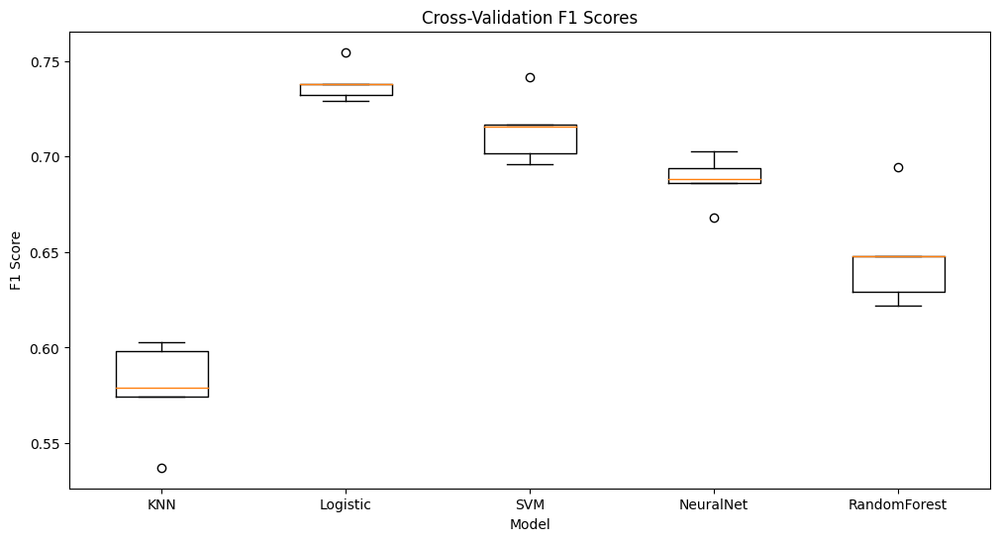

In [ ]:
from sklearn.model_selection import cross_val_score

### CROSS VALIDATION F1
classifiers = [model_knn, chosen_model, model, model_MLP, model_RFC] #model_tree, model_NBC,
cv_results = []

for clf in classifiers:
    cv_scores = cross_val_score(clf, X_train, y_train, cv=5, scoring='f1')
    cv_results.append(cv_scores)

plt.figure(figsize=(12, 6))
plt.boxplot(cv_results, labels=['KNN', 'Logistic', 'SVM', 'NeuralNet', 'RandomForest']) #'Tree', 'NB',
plt.title('Cross-Validation F1 Scores')
plt.ylabel('F1 Score')
plt.xlabel('Model')
plt.show()